In [1]:
import sys
sys.path.append('..')

import os
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters import gaussian, threshold_otsu
from skimage.transform import resize
from skimage import io
import pickle
from skimage.measure import regionprops

import matplotlib.pyplot as plt
import torch
import time
import model.model_cnnvae_conditional
import model.optimizer as optimizer
from sklearn.decomposition import PCA
import pandas as pd

In [2]:
sharedSizes=[1024]
dSpecific_filter=[(200,16)]
pID_type='randInit'
pIDemb_size=64

In [3]:
holdOutSamples=['HV1','P22','P14','P27']

In [4]:
sourceDir='/data/xinyi/c2p/data/chromark'
segDir=os.path.join(sourceDir,'nuclear_masks')
imgDir=os.path.join(sourceDir,'raw_data')
conditions=['controls','headneck','meningioma', 'glioma']

outSize=128
savename='pathCentered_'+str(outSize)

imgsC_all=None
imgsP_all=None
imgNames_all=None
proteinNames=None
pID_all=None
for condition_i in conditions:
    print(condition_i)
    segDir_i=os.path.join(segDir,condition_i)
    imgDir_i=os.path.join(imgDir,condition_i)
    for stain in os.listdir(segDir_i):
        print(stain)
        segDir_i_stain=os.path.join(segDir_i,stain)
        imgDir_i_stain=os.path.join(imgDir_i,stain)
        
        segPID2name={}
        for pID_dir in os.listdir(segDir_i_stain):
            pID=pID_dir.split('_')
            segPID2name[pID[0]]=pID_dir
        imgPID2name={}
        for pID_dir in os.listdir(imgDir_i_stain):
            pID=pID_dir.split('_')
            imgPID2name[pID[0]]=pID_dir
        for pID in segPID2name.keys():
            if condition_i=='meningioma' and stain=='dapi_gh2ax_lamin_cd3' and pID=='P33': #skipping incorrect images
                continue
            if pID in holdOutSamples:
                print('hold out: '+pID)
                continue
            print(pID)
            if pID not in imgPID2name:
                print('img not found '+pID)
                continue
            imgDir_i_stain_p=os.path.join(imgDir_i_stain,imgPID2name[pID])
            segDir_i_stain_p=os.path.join(segDir_i_stain,segPID2name[pID])
            
            with open(os.path.join(imgDir_i_stain_p,savename+'_imgNames'), 'rb') as output:
                imgNames=pickle.load(output)
            with open(os.path.join(imgDir_i_stain_p,savename+'_img'), 'rb') as output:
                img=pickle.load(output)

            imgP=np.zeros((img.shape[0],1,img.shape[2],img.shape[3]))
            proteinNames_curr=np.array([])
            stain_list=stain.split('_')
            nImgPerStain=int(img.shape[0]/(len(stain_list)-1))
            np.random.seed(3)
            allIdx_all=np.arange(img.shape[0])
            np.random.shuffle(allIdx_all)
            for s in range(1,len(stain_list)):
                s_start=(s-1)*nImgPerStain
                if s==len(stain_list)-1:
                    s_end=img.shape[0]
                else:
                    s_end=s*nImgPerStain
                imgP[s_start:s_end]=img[allIdx_all[s_start:s_end],s].reshape(s_end-s_start,1,img.shape[2],img.shape[3])
                proteinNames_curr=np.concatenate((proteinNames_curr,np.repeat(stain_list[s],s_end-s_start)))
            
            if pID_all is None:
                pID_all=np.repeat(pID,img.shape[0])
                imgsC_all=img[allIdx_all,[0]]
                imgNames_all=imgNames[allIdx_all]
                proteinNames=proteinNames_curr
                imgsP_all=imgP
            else:
                pID_all=np.concatenate((pID_all,np.repeat(pID,img.shape[0])))
                imgsC_all=np.concatenate((imgsC_all,img[allIdx_all,[0]]),axis=0)
                imgNames_all=np.concatenate((imgNames_all,imgNames[allIdx_all]))
                proteinNames=np.concatenate((proteinNames,proteinNames_curr))
                imgsP_all=np.concatenate((imgsP_all,imgP),axis=0)
imgsC_all=imgsC_all.reshape(imgsC_all.shape[0],1,imgsC_all.shape[1],imgsC_all.shape[2])

controls
dapi_gh2ax_lamin
HV5
HV4
HV2
HV10
hold out: HV1
HV7
HV9
HV8
HV3
HV6
dapi_cd8_cd4
hold out: HV1
HV8
HV6
HV7
HV4
HV5
HV3
HV2
headneck
dapi_gh2ax_lamin_cd3
P72
P63
hold out: P14
P44
P41
P56
P18
P55
P50
P24
dapi_cd16_cd4_cd8
P55
P56
P72
hold out: P14
P18
P41
P44
P63
P50
P24
meningioma
dapi_gh2ax_lamin_cd3
hold out: P27
P70
P83
P42
P59
P38
P48
P37
P62
dapi_cd16_cd4_cd8
P42
P48
P62
P38
P83
P37
P33
P70
P59
hold out: P27
glioma
dapi_gh2ax_lamin_cd3
P46
P16
P52
hold out: P22
P84
P47
P57
P15
P29
img not found P29
P68
dapi_cd16_cd4_cd8
P46
P47
P29
P52
P57
hold out: P22
P68
P16
P84
P15


In [5]:
imgsC_all.shape

(29174, 1, 128, 128)

In [6]:
nProt=np.unique(proteinNames).size
pnames,revIdx,pCounts=np.unique(proteinNames,return_inverse=True,return_counts=True)
plabels=torch.tensor(np.arange(pnames.size)[revIdx]).long()

In [7]:
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

In [8]:
#VAE settings
seed=3
epochs=5001
saveFreq=100
lr_latent=0.001 #initial learning rate
lr_decoder=0.0001
weight_decay=0 #Weight for L2 loss on embedding matrix.

# batchsize=4
batchsize=256
kernel_size=4
stride=2
padding=1

# fc_dim1=6000
hidden1=64 #Number of channels in hidden layer 1
hidden2=128 
hidden3=256
hidden4=256
hidden5=96
hidden5_xy=4
fc_dim1=96*hidden5_xy*hidden5_xy
fc_dim2=6000
# fc_dim3=128
# fc_dim4=128
# gcn_dim1=2600
# adv_hidden=128

dropout=0.01
kl_weight=0.0000001





In [9]:
printFreq=1
trainIdx=np.arange(imgsC_all.shape[0])
def train(epoch):
    t = time.time()
    modelcnn_dna.train()
    modelcnn_protein.train()
    modelcnn_dnaShared.train()
    modelcnn_pShared.train()

    loss_x_train_all_dna=0
    loss_x_trainShared_all_dna=0
    loss_x_train_all_protein=0
    loss_x_trainShared_all_protein=0
    loss_lNorm_all=0
    loss_lNorm_all_dna=0
    loss_lNorm_all_protein=0
    loss_all=0
    ntrainBatches=int(np.ceil(trainIdx.shape[0]/batchsize))
    for i in range(ntrainBatches):
#         if i%200==0:
#         print(i)
        trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
        traintarget_protein=torch.tensor(imgsP_all[trainIdx_i]).cuda().float()
        traintarget_dna=torch.tensor(imgsC_all[trainIdx_i]).cuda().float()
        trainIdx_i=torch.tensor(trainIdx_i)
        trainInput_ID=plabels[trainIdx_i].cuda()
        trainInput_shared=latent_shared(trainIdx_i).cuda().float()
        trainInput_dna=latent_dna(trainIdx_i).cuda().float()
        trainInput_protein=latent_protein(trainIdx_i).cuda().float()
        if addNoise:
            trainInput_shared=trainInput_shared+torch.randn_like(trainInput_shared)
            trainInput_dna=trainInput_dna+torch.randn_like(trainInput_dna)
            trainInput_protein=trainInput_protein+torch.randn_like(trainInput_protein)
#         print(trainInput.shape)

        optimizer_dna.zero_grad()
        optimizer_protein.zero_grad()
        optimizer_dnaShared.zero_grad()
        optimizer_pShared.zero_grad()
        optimizer_latent.zero_grad()

        recon_dna= modelcnn_dna(torch.cat((trainInput_shared,trainInput_dna),dim=1),pIDemb(trainInput_ID))
        reconShared_dna=modelcnn_dnaShared(trainInput_shared,pIDemb(trainInput_ID))
        recon_protein= modelcnn_protein(torch.cat((trainInput_shared,trainInput_protein),dim=1),pIDemb(trainInput_ID))
        reconShared_protein=modelcnn_pShared(trainInput_shared,pIDemb(trainInput_ID))
        
        loss_x_train_protein=loss_x(recon_protein, traintarget_protein)
        loss_xShared_train_protein=loss_x(reconShared_protein,traintarget_protein)
        loss_x_train_dna=loss_x(recon_dna, traintarget_dna)
        loss_xShared_train_dna=loss_x(reconShared_dna,traintarget_dna)
        
        loss=loss_x_train_protein+loss_xShared_train_protein+loss_x_train_dna+loss_xShared_train_dna
        if addNoise:
            loss_lNorm=torch.mean(torch.linalg.norm(latent_shared(trainIdx_i).cuda(),dim=1))/latent_shared.embedding_dim
            loss_lNorm_all+=loss_lNorm.item()
            loss+=loss_lNorm*actDecay
            
            loss_lNorm_dna=torch.mean(torch.linalg.norm(latent_dna(trainIdx_i).cuda(),dim=1))/latent_dna.embedding_dim
            loss_lNorm_all_dna+=loss_lNorm_dna.item()
            loss+=loss_lNorm_dna*actDecay
            
            loss_lNorm_protein=torch.mean(torch.linalg.norm(latent_protein(trainIdx_i).cuda(),dim=1))/latent_protein.embedding_dim
            loss_lNorm_all_protein+=loss_lNorm_protein.item()
            loss+=loss_lNorm_protein*actDecay
        
        loss_x_train_all_dna+=loss_x_train_dna.item()
        loss_x_trainShared_all_dna+=loss_xShared_train_dna.item()
        loss_x_train_all_protein+=loss_x_train_protein.item()
        loss_x_trainShared_all_protein+=loss_xShared_train_protein.item()
        loss_all+=loss.item()
        
        loss.backward()
        optimizer_dna.step()
        optimizer_dnaShared.step()
        optimizer_protein.step()
        optimizer_pShared.step()
        optimizer_latent.step()


    loss_x_train_all_dna=loss_x_train_all_dna/ntrainBatches
    loss_x_trainShared_all_dna=loss_x_trainShared_all_dna/ntrainBatches
    loss_x_train_all_protein=loss_x_train_all_protein/ntrainBatches
    loss_x_trainShared_all_protein=loss_x_trainShared_all_protein/ntrainBatches
    loss_all=loss_all/ntrainBatches
    if addNoise:
        loss_lNorm_all=loss_lNorm_all/ntrainBatches
        loss_lNorm_all_dna=loss_lNorm_all_dna/ntrainBatches
        loss_lNorm_all_protein=loss_lNorm_all_protein/ntrainBatches

#     with torch.no_grad():
#         modelcnn_dna.eval()
#         modelcnn_protein.eval()
#         modelcnn_dnaShared.eval()
#         modelcnn_pShared.eval()



#         loss_val_all=0
#         loss_x_val_all_dna=0
#         loss_x_valShared_all_dna=0
#         loss_x_val_all_protein=0
#         loss_x_valShared_all_protein=0
#         nvalBatches=int(np.ceil(valIdx.shape[0]/batchsize))
#         for i in range(nvalBatches):
#             valIdx_i=valIdx[i*batchsize:min((i+1)*batchsize,valIdx.shape[0])]
#             valtarget_protein=torch.tensor(imgsP_all[valIdx_i]).cuda().float()
#             valtarget_dna=torch.tensor(imgsC_all[valIdx_i]).cuda().float()
#             valInput_ID=plabels[valIdx_i].cuda()
#             valIdx_i=torch.tensor(valIdx_i)
#             valInput_shared=latent_shared(valIdx_i).cuda().float()
#             valInput_dna=latent_dna(valIdx_i).cuda().float()
#             valInput_protein=latent_protein(valIdx_i).cuda().float()

#             recon_dna= modelcnn_dna(torch.cat((valInput_shared,valInput_dna),dim=1),pIDemb(valInput_ID))
#             reconShared_dna=modelcnn_dnaShared(valInput_shared,pIDemb(valInput_ID))
#             recon_protein= modelcnn_protein(torch.cat((valInput_shared,valInput_protein),dim=1),pIDemb(valInput_ID))
#             reconShared_protein=modelcnn_pShared(valInput_shared,pIDemb(valInput_ID))



#             loss_x_val_protein=loss_x(recon_protein, valtarget_protein)
#             loss_xShared_val_protein=loss_x(reconShared_protein,valtarget_protein)
#             loss_x_val_dna=loss_x(recon_dna, valtarget_dna)
#             loss_xShared_val_dna=loss_x(reconShared_dna,valtarget_dna)

#             loss=loss_x_val_protein+loss_xShared_val_protein+loss_x_val_dna+loss_xShared_val_dna

#             loss_x_val_all_dna+=loss_x_val_dna.item()
#             loss_x_valShared_all_dna+=loss_xShared_val_dna.item()
#             loss_x_val_all_protein+=loss_x_val_protein.item()
#             loss_x_valShared_all_protein+=loss_xShared_val_protein.item()
#             loss_val_all+=loss.item()

#         loss_x_val_all_dna=loss_x_val_all_dna/nvalBatches
#         loss_x_valShared_all_dna=loss_x_valShared_all_dna/nvalBatches
#         loss_x_val_all_protein=loss_x_val_all_protein/nvalBatches
#         loss_x_valShared_all_protein=loss_x_valShared_all_protein/nvalBatches
#         loss_val_all=loss_val_all/nvalBatches



    if epoch%printFreq==0:
        print('Epoch: {:04d}'.format(epoch),
              'loss_train: {:.4f}'.format(loss_all),
              'loss_x_train_dna: {:.4f}'.format(loss_x_train_all_dna),
              'loss_x_train_protein: {:.4f}'.format(loss_x_train_all_protein),
              'loss_xShared_train_dna: {:.4f}'.format(loss_x_trainShared_all_dna),
              'loss_xShared_train_protein: {:.4f}'.format(loss_x_trainShared_all_protein),
              'time: {:.4f}s'.format(time.time() - t))
    return loss_all,loss_x_train_all_dna,loss_x_train_all_protein,loss_x_trainShared_all_dna,loss_x_trainShared_all_protein,loss_lNorm_all,loss_lNorm_all_dna,loss_lNorm_all_protein

In [11]:
match_weight=1
sharedWeight=1
addNoise=True
actDecay=0.001
name_train='splitChannels_conditional_lord_withNoise'
modelname_train='cnn_vae_pbmc_lord'
logsavepath_train=os.path.join('/data/xinyi/c2p/log/',modelname_train,name_train)
modelsavepath_train=os.path.join('/data/xinyi/c2p/models/',modelname_train,name_train)
plotsavepath_train=os.path.join('/data/xinyi/c2p/plots/',modelname_train,name_train)

if not os.path.exists(os.path.join('/data/xinyi/c2p/log/',modelname_train)):
    os.mkdir(os.path.join('/data/xinyi/c2p/log/',modelname_train))
    os.mkdir(os.path.join('/data/xinyi/c2p/models/',modelname_train))
    os.mkdir(os.path.join('/data/xinyi/c2p/plots/',modelname_train))
if not os.path.exists(logsavepath_train):
    os.mkdir(logsavepath_train)
    os.mkdir(os.path.join(logsavepath_train,'dna'))
    os.mkdir(os.path.join(logsavepath_train,'protein'))
if not os.path.exists(modelsavepath_train):
    os.mkdir(modelsavepath_train)
    os.mkdir(os.path.join(modelsavepath_train,'dna'))
    os.mkdir(os.path.join(modelsavepath_train,'protein'))
if not os.path.exists(plotsavepath_train):
    os.mkdir(plotsavepath_train)
    os.mkdir(os.path.join(plotsavepath_train,'dna'))
    os.mkdir(os.path.join(plotsavepath_train,'protein'))




In [12]:

logsavepath_p_dna=os.path.join(logsavepath_train,'dna')
modelsavepath_p_dna=os.path.join(modelsavepath_train,'dna')
plotsavepath_p_dna=os.path.join(plotsavepath_train,'dna')
if not os.path.exists(logsavepath_p_dna):
    os.mkdir(logsavepath_p_dna)
if not os.path.exists(modelsavepath_p_dna):
    os.mkdir(modelsavepath_p_dna)
if not os.path.exists(plotsavepath_p_dna):
    os.mkdir(plotsavepath_p_dna)

logsavepath_p_protein=os.path.join(logsavepath_train,'protein')
modelsavepath_p_protein=os.path.join(modelsavepath_train,'protein')
plotsavepath_p_protein=os.path.join(plotsavepath_train,'protein')
if not os.path.exists(logsavepath_p_protein):
    os.mkdir(logsavepath_p_protein)
if not os.path.exists(modelsavepath_p_protein):
    os.mkdir(modelsavepath_p_protein)
if not os.path.exists(plotsavepath_p_protein):
    os.mkdir(plotsavepath_p_protein)



for currLatentSize in sharedSizes:
    for dSpecificSize,dfilterSize in dSpecific_filter:
        latent_curr=None
        if os.path.exists(os.path.join(plotsavepath_p_dna,'loss_seed3_match'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg')):
            continue
#         if sIdx==0:
#             continue


        print(currLatentSize)
        print(dSpecificSize)
        dna_cShared=hidden5-dfilterSize
        p_cShared=dna_cShared

        loss_x=torch.nn.MSELoss()

        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.enabled = True
        if modelname_train=='cnn_vae_pbmc_lord':
            modelcnn_dna = model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,pIDemb_size)
            modelcnn_protein = model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,pIDemb_size)
            modelcnn_dnaShared=model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize,pIDemb_size)
            modelcnn_pShared=model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize,pIDemb_size)
        modelcnn_dna=modelcnn_dna
        modelcnn_protein=modelcnn_protein
        modelcnn_dnaShared=modelcnn_dnaShared
        modelcnn_pShared=modelcnn_pShared
        modelcnn_dna.cuda()
        modelcnn_protein.cuda()
        modelcnn_dnaShared.cuda()
        modelcnn_pShared.cuda()

        optimizer_dna = torch.optim.Adam(modelcnn_dna.parameters(), lr=lr_decoder, weight_decay=weight_decay)
        optimizer_protein = torch.optim.Adam(modelcnn_protein.parameters(), lr=lr_decoder, weight_decay=weight_decay)
        optimizer_dnaShared = torch.optim.Adam(modelcnn_dnaShared.parameters(), lr=lr_decoder, weight_decay=weight_decay)
        optimizer_pShared = torch.optim.Adam(modelcnn_pShared.parameters(), lr=lr_decoder, weight_decay=weight_decay)

        train_loss=[np.inf]*(epochs)
        train_loss_x_dna=[np.inf]*(epochs)
        train_loss_xShared_dna=[np.inf]*(epochs)

        train_loss_x_protein=[np.inf]*(epochs)
        train_loss_xShared_protein=[np.inf]*(epochs)
        
        train_lNorm=[np.inf]*(epochs)
        train_lNorm_dna=[np.inf]*(epochs)
        train_lNorm_protein=[np.inf]*(epochs)

        t_ep=time.time()

        stateDict_train_dna={}
        stateDict_train_protein={}
        stateDict_train_dnaShared={}
        stateDict_train_proteinShared={}
        
        
        latent_shared=torch.nn.Embedding(proteinNames.size,currLatentSize)
        latent_protein=torch.nn.Embedding(proteinNames.size,dSpecificSize)
        latent_dna=torch.nn.Embedding(proteinNames.size,dSpecificSize)
        pIDemb=torch.nn.Embedding(nProt, pIDemb_size).cuda()
        optimizer_latent= torch.optim.Adam([latent_shared.weight,latent_protein.weight,latent_dna.weight,pIDemb.weight], lr=lr_latent, weight_decay=weight_decay)


#         epCounts=0
        for ep in range(epochs):
            train_loss[ep],train_loss_x_dna[ep],train_loss_x_protein[ep],train_loss_xShared_dna[ep],train_loss_xShared_protein[ep],train_lNorm[ep],train_lNorm_dna[ep],train_lNorm_protein[ep]=train(ep)

#             if ep>200 and (val_loss_x_dna[ep]>=val_loss_x_dna[ep-200] or val_loss_x_protein[ep]>=val_loss_x_protein[ep-200]):
#                 epCounts+=1
#             else:
#                 epCounts=0

#             if epCounts>100:
#                 break


            if ep%saveFreq == (saveFreq-1):
                stateDict_train_dna[ep]=modelcnn_dna.cpu().state_dict()
                stateDict_train_protein[ep]=modelcnn_protein.cpu().state_dict()
                stateDict_train_dnaShared[ep]=modelcnn_dnaShared.cpu().state_dict()
                stateDict_train_proteinShared[ep]=modelcnn_pShared.cpu().state_dict()
                with open(os.path.join(modelsavepath_p_dna,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_dna.weight, output, pickle.HIGHEST_PROTOCOL)
                with open(os.path.join(modelsavepath_p_dna,'latentShared_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_shared.weight, output, pickle.HIGHEST_PROTOCOL)
                with open(os.path.join(modelsavepath_p_protein,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_protein.weight, output, pickle.HIGHEST_PROTOCOL)
                with open(os.path.join(modelsavepath_p_protein,'pIDemb_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(pIDemb.weight, output, pickle.HIGHEST_PROTOCOL)


            modelcnn_dna.cuda()
            modelcnn_protein.cuda()
            modelcnn_dnaShared.cuda()
            modelcnn_pShared.cuda()
            torch.cuda.empty_cache()
        print(' total time: {:.4f}s'.format(time.time() - t_ep))

        with open(os.path.join(modelsavepath_p_dna,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(stateDict_train_dna, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(modelsavepath_p_protein,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(stateDict_train_protein, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(modelsavepath_p_dna,'stateDictShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(stateDict_train_dnaShared, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(modelsavepath_p_protein,'stateDictShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(stateDict_train_proteinShared, output, pickle.HIGHEST_PROTOCOL)
        

        with open(os.path.join(logsavepath_p_dna,'train_loss_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_dna,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss_x_dna, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_dna,'train_loss_xShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss_xShared_dna, output, pickle.HIGHEST_PROTOCOL)


        with open(os.path.join(logsavepath_p_protein,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss_x_protein, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_protein,'train_loss_xShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss_xShared_protein, output, pickle.HIGHEST_PROTOCOL)
            
        with open(os.path.join(logsavepath_p_dna,'train_lNorm_'+str(currLatentSize)), 'wb') as output:
            pickle.dump(train_lNorm, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_dna,'train_lNormDNA_'+str(currLatentSize)), 'wb') as output:
            pickle.dump(train_lNorm_dna, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_protein,'train_lNormProtein_'+str(currLatentSize)), 'wb') as output:
            pickle.dump(train_lNorm_protein, output, pickle.HIGHEST_PROTOCOL)


        plt.plot(np.arange(epochs),train_loss_x_dna)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
        plt.show()


        plt.plot(np.arange(epochs),train_loss_x_protein)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_protein,'loss_seed3_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
        plt.show()

        plt.plot(np.arange(epochs),train_loss_xShared_dna)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training shared recon','validation shared recon'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_xShared'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
        plt.show()

        plt.plot(np.arange(epochs),train_loss_xShared_protein)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training shared recon','validation shared recon'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_protein,'loss_seed3_xShared'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
        plt.show()










1024
200
Epoch: 0000 loss_train: 0.3464 loss_x_train_dna: 0.0859 loss_x_train_protein: 0.0887 loss_xShared_train_dna: 0.0723 loss_xShared_train_protein: 0.0994 time: 32.2482s
Epoch: 0001 loss_train: 0.1631 loss_x_train_dna: 0.0326 loss_x_train_protein: 0.0494 loss_xShared_train_dna: 0.0288 loss_xShared_train_protein: 0.0521 time: 32.2833s
Epoch: 0002 loss_train: 0.1388 loss_x_train_dna: 0.0233 loss_x_train_protein: 0.0445 loss_xShared_train_dna: 0.0219 loss_xShared_train_protein: 0.0490 time: 30.9722s
Epoch: 0003 loss_train: 0.1304 loss_x_train_dna: 0.0205 loss_x_train_protein: 0.0434 loss_xShared_train_dna: 0.0201 loss_xShared_train_protein: 0.0462 time: 31.9318s
Epoch: 0004 loss_train: 0.1264 loss_x_train_dna: 0.0190 loss_x_train_protein: 0.0429 loss_xShared_train_dna: 0.0196 loss_xShared_train_protein: 0.0447 time: 30.9926s
Epoch: 0005 loss_train: 0.1242 loss_x_train_dna: 0.0185 loss_x_train_protein: 0.0426 loss_xShared_train_dna: 0.0189 loss_xShared_train_protein: 0.0441 time: 31.7

Epoch: 0050 loss_train: 0.0192 loss_x_train_dna: 0.0063 loss_x_train_protein: 0.0029 loss_xShared_train_dna: 0.0067 loss_xShared_train_protein: 0.0031 time: 34.8209s
Epoch: 0051 loss_train: 0.0189 loss_x_train_dna: 0.0063 loss_x_train_protein: 0.0029 loss_xShared_train_dna: 0.0065 loss_xShared_train_protein: 0.0031 time: 30.9916s
Epoch: 0052 loss_train: 0.0188 loss_x_train_dna: 0.0062 loss_x_train_protein: 0.0029 loss_xShared_train_dna: 0.0065 loss_xShared_train_protein: 0.0031 time: 32.6873s
Epoch: 0053 loss_train: 0.0185 loss_x_train_dna: 0.0061 loss_x_train_protein: 0.0029 loss_xShared_train_dna: 0.0063 loss_xShared_train_protein: 0.0030 time: 29.9683s
Epoch: 0054 loss_train: 0.0183 loss_x_train_dna: 0.0060 loss_x_train_protein: 0.0029 loss_xShared_train_dna: 0.0063 loss_xShared_train_protein: 0.0030 time: 29.8903s
Epoch: 0055 loss_train: 0.0182 loss_x_train_dna: 0.0059 loss_x_train_protein: 0.0029 loss_xShared_train_dna: 0.0062 loss_xShared_train_protein: 0.0030 time: 35.4877s
Epoc

Epoch: 0100 loss_train: 0.0138 loss_x_train_dna: 0.0045 loss_x_train_protein: 0.0023 loss_xShared_train_dna: 0.0045 loss_xShared_train_protein: 0.0024 time: 30.0482s
Epoch: 0101 loss_train: 0.0137 loss_x_train_dna: 0.0045 loss_x_train_protein: 0.0023 loss_xShared_train_dna: 0.0045 loss_xShared_train_protein: 0.0023 time: 32.7394s
Epoch: 0102 loss_train: 0.0137 loss_x_train_dna: 0.0045 loss_x_train_protein: 0.0023 loss_xShared_train_dna: 0.0044 loss_xShared_train_protein: 0.0023 time: 33.8399s
Epoch: 0103 loss_train: 0.0136 loss_x_train_dna: 0.0045 loss_x_train_protein: 0.0022 loss_xShared_train_dna: 0.0044 loss_xShared_train_protein: 0.0023 time: 30.0891s
Epoch: 0104 loss_train: 0.0135 loss_x_train_dna: 0.0044 loss_x_train_protein: 0.0022 loss_xShared_train_dna: 0.0044 loss_xShared_train_protein: 0.0023 time: 29.5671s
Epoch: 0105 loss_train: 0.0135 loss_x_train_dna: 0.0044 loss_x_train_protein: 0.0022 loss_xShared_train_dna: 0.0044 loss_xShared_train_protein: 0.0023 time: 30.2734s
Epoc

Epoch: 0150 loss_train: 0.0114 loss_x_train_dna: 0.0036 loss_x_train_protein: 0.0020 loss_xShared_train_dna: 0.0036 loss_xShared_train_protein: 0.0020 time: 51.0125s
Epoch: 0151 loss_train: 0.0114 loss_x_train_dna: 0.0036 loss_x_train_protein: 0.0020 loss_xShared_train_dna: 0.0036 loss_xShared_train_protein: 0.0020 time: 46.2156s
Epoch: 0152 loss_train: 0.0114 loss_x_train_dna: 0.0037 loss_x_train_protein: 0.0020 loss_xShared_train_dna: 0.0036 loss_xShared_train_protein: 0.0020 time: 48.5480s
Epoch: 0153 loss_train: 0.0114 loss_x_train_dna: 0.0037 loss_x_train_protein: 0.0019 loss_xShared_train_dna: 0.0036 loss_xShared_train_protein: 0.0020 time: 54.6127s
Epoch: 0154 loss_train: 0.0113 loss_x_train_dna: 0.0037 loss_x_train_protein: 0.0019 loss_xShared_train_dna: 0.0036 loss_xShared_train_protein: 0.0020 time: 46.8523s
Epoch: 0155 loss_train: 0.0113 loss_x_train_dna: 0.0036 loss_x_train_protein: 0.0019 loss_xShared_train_dna: 0.0036 loss_xShared_train_protein: 0.0020 time: 46.8439s
Epoc

Epoch: 0202 loss_train: 0.0102 loss_x_train_dna: 0.0031 loss_x_train_protein: 0.0018 loss_xShared_train_dna: 0.0032 loss_xShared_train_protein: 0.0019 time: 48.7588s
Epoch: 0203 loss_train: 0.0101 loss_x_train_dna: 0.0031 loss_x_train_protein: 0.0018 loss_xShared_train_dna: 0.0032 loss_xShared_train_protein: 0.0018 time: 47.8467s
Epoch: 0204 loss_train: 0.0101 loss_x_train_dna: 0.0031 loss_x_train_protein: 0.0018 loss_xShared_train_dna: 0.0032 loss_xShared_train_protein: 0.0018 time: 47.3927s
Epoch: 0205 loss_train: 0.0101 loss_x_train_dna: 0.0031 loss_x_train_protein: 0.0018 loss_xShared_train_dna: 0.0032 loss_xShared_train_protein: 0.0018 time: 51.7272s
Epoch: 0206 loss_train: 0.0100 loss_x_train_dna: 0.0031 loss_x_train_protein: 0.0018 loss_xShared_train_dna: 0.0032 loss_xShared_train_protein: 0.0018 time: 55.1883s
Epoch: 0207 loss_train: 0.0100 loss_x_train_dna: 0.0031 loss_x_train_protein: 0.0018 loss_xShared_train_dna: 0.0031 loss_xShared_train_protein: 0.0018 time: 50.9048s
Epoc

Epoch: 0252 loss_train: 0.0095 loss_x_train_dna: 0.0029 loss_x_train_protein: 0.0017 loss_xShared_train_dna: 0.0029 loss_xShared_train_protein: 0.0017 time: 49.5921s
Epoch: 0253 loss_train: 0.0094 loss_x_train_dna: 0.0029 loss_x_train_protein: 0.0017 loss_xShared_train_dna: 0.0029 loss_xShared_train_protein: 0.0017 time: 44.5330s
Epoch: 0254 loss_train: 0.0094 loss_x_train_dna: 0.0029 loss_x_train_protein: 0.0017 loss_xShared_train_dna: 0.0029 loss_xShared_train_protein: 0.0017 time: 47.0113s
Epoch: 0255 loss_train: 0.0094 loss_x_train_dna: 0.0029 loss_x_train_protein: 0.0017 loss_xShared_train_dna: 0.0029 loss_xShared_train_protein: 0.0017 time: 45.9910s
Epoch: 0256 loss_train: 0.0094 loss_x_train_dna: 0.0029 loss_x_train_protein: 0.0017 loss_xShared_train_dna: 0.0029 loss_xShared_train_protein: 0.0017 time: 45.7806s
Epoch: 0257 loss_train: 0.0093 loss_x_train_dna: 0.0028 loss_x_train_protein: 0.0017 loss_xShared_train_dna: 0.0029 loss_xShared_train_protein: 0.0017 time: 44.5083s
Epoc

Epoch: 0302 loss_train: 0.0088 loss_x_train_dna: 0.0027 loss_x_train_protein: 0.0017 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0017 time: 45.7004s
Epoch: 0303 loss_train: 0.0088 loss_x_train_dna: 0.0027 loss_x_train_protein: 0.0017 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0017 time: 46.9205s
Epoch: 0304 loss_train: 0.0088 loss_x_train_dna: 0.0027 loss_x_train_protein: 0.0017 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0017 time: 46.4503s
Epoch: 0305 loss_train: 0.0088 loss_x_train_dna: 0.0027 loss_x_train_protein: 0.0017 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0017 time: 47.6769s
Epoch: 0306 loss_train: 0.0088 loss_x_train_dna: 0.0026 loss_x_train_protein: 0.0016 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0017 time: 44.7550s
Epoch: 0307 loss_train: 0.0088 loss_x_train_dna: 0.0026 loss_x_train_protein: 0.0016 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0017 time: 45.0034s
Epoc

Epoch: 0352 loss_train: 0.0084 loss_x_train_dna: 0.0025 loss_x_train_protein: 0.0016 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 46.7905s
Epoch: 0353 loss_train: 0.0084 loss_x_train_dna: 0.0025 loss_x_train_protein: 0.0016 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 49.1053s
Epoch: 0354 loss_train: 0.0084 loss_x_train_dna: 0.0025 loss_x_train_protein: 0.0016 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 47.3369s
Epoch: 0355 loss_train: 0.0083 loss_x_train_dna: 0.0025 loss_x_train_protein: 0.0016 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 47.0632s
Epoch: 0356 loss_train: 0.0083 loss_x_train_dna: 0.0025 loss_x_train_protein: 0.0016 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 48.7106s
Epoch: 0357 loss_train: 0.0083 loss_x_train_dna: 0.0025 loss_x_train_protein: 0.0016 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 47.1273s
Epoc

Epoch: 0402 loss_train: 0.0081 loss_x_train_dna: 0.0024 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 47.1786s
Epoch: 0403 loss_train: 0.0080 loss_x_train_dna: 0.0024 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 46.5870s
Epoch: 0404 loss_train: 0.0080 loss_x_train_dna: 0.0024 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 46.9451s
Epoch: 0405 loss_train: 0.0080 loss_x_train_dna: 0.0024 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 48.9115s
Epoch: 0406 loss_train: 0.0080 loss_x_train_dna: 0.0024 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 47.4746s
Epoch: 0407 loss_train: 0.0080 loss_x_train_dna: 0.0024 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 48.0955s
Epoc

Epoch: 0452 loss_train: 0.0078 loss_x_train_dna: 0.0023 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 48.6189s
Epoch: 0453 loss_train: 0.0078 loss_x_train_dna: 0.0023 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 45.8176s
Epoch: 0454 loss_train: 0.0078 loss_x_train_dna: 0.0023 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 46.7922s
Epoch: 0455 loss_train: 0.0078 loss_x_train_dna: 0.0023 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 45.9877s
Epoch: 0456 loss_train: 0.0078 loss_x_train_dna: 0.0023 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 48.5428s
Epoch: 0457 loss_train: 0.0078 loss_x_train_dna: 0.0023 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 46.8336s
Epoc

Epoch: 0502 loss_train: 0.0076 loss_x_train_dna: 0.0022 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 48.2293s
Epoch: 0503 loss_train: 0.0076 loss_x_train_dna: 0.0022 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 47.3133s
Epoch: 0504 loss_train: 0.0076 loss_x_train_dna: 0.0022 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 46.6302s
Epoch: 0505 loss_train: 0.0076 loss_x_train_dna: 0.0022 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 46.4159s
Epoch: 0506 loss_train: 0.0076 loss_x_train_dna: 0.0022 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 45.0635s
Epoch: 0507 loss_train: 0.0076 loss_x_train_dna: 0.0022 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 46.3986s
Epoc

Epoch: 0552 loss_train: 0.0074 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 44.8815s
Epoch: 0553 loss_train: 0.0074 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 46.6932s
Epoch: 0554 loss_train: 0.0074 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 47.4608s
Epoch: 0555 loss_train: 0.0074 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 47.6819s
Epoch: 0556 loss_train: 0.0074 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 48.6405s
Epoch: 0557 loss_train: 0.0074 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0015 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 44.1832s
Epoc

Epoch: 0602 loss_train: 0.0073 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 42.5353s
Epoch: 0603 loss_train: 0.0073 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0015 time: 43.8399s
Epoch: 0604 loss_train: 0.0073 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 45.2161s
Epoch: 0605 loss_train: 0.0073 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 42.8340s
Epoch: 0606 loss_train: 0.0072 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 44.1006s
Epoch: 0607 loss_train: 0.0072 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 44.5689s
Epoc

Epoch: 0652 loss_train: 0.0072 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 46.3843s
Epoch: 0653 loss_train: 0.0072 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 42.6894s
Epoch: 0654 loss_train: 0.0072 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 45.3089s
Epoch: 0655 loss_train: 0.0072 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 43.7566s
Epoch: 0656 loss_train: 0.0072 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 45.8189s
Epoch: 0657 loss_train: 0.0071 loss_x_train_dna: 0.0021 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 45.1449s
Epoc

Epoch: 0702 loss_train: 0.0070 loss_x_train_dna: 0.0020 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 45.7831s
Epoch: 0703 loss_train: 0.0070 loss_x_train_dna: 0.0020 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 47.0769s
Epoch: 0704 loss_train: 0.0070 loss_x_train_dna: 0.0020 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 47.9472s
Epoch: 0705 loss_train: 0.0070 loss_x_train_dna: 0.0020 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 45.2794s
Epoch: 0706 loss_train: 0.0070 loss_x_train_dna: 0.0020 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 44.6048s
Epoch: 0707 loss_train: 0.0070 loss_x_train_dna: 0.0020 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 46.4931s
Epoc

Epoch: 0752 loss_train: 0.0069 loss_x_train_dna: 0.0020 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 45.9238s
Epoch: 0753 loss_train: 0.0069 loss_x_train_dna: 0.0020 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 46.1566s
Epoch: 0754 loss_train: 0.0069 loss_x_train_dna: 0.0020 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 44.9500s
Epoch: 0755 loss_train: 0.0069 loss_x_train_dna: 0.0020 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 44.6184s
Epoch: 0756 loss_train: 0.0069 loss_x_train_dna: 0.0020 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 45.8700s
Epoch: 0757 loss_train: 0.0069 loss_x_train_dna: 0.0020 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 44.6357s
Epoc

Epoch: 0802 loss_train: 0.0068 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 46.2912s
Epoch: 0803 loss_train: 0.0068 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 51.2251s
Epoch: 0804 loss_train: 0.0068 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 50.3260s
Epoch: 0805 loss_train: 0.0068 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 48.2346s
Epoch: 0806 loss_train: 0.0068 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 45.8821s
Epoch: 0807 loss_train: 0.0068 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 50.1450s
Epoc

Epoch: 0852 loss_train: 0.0067 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 49.3654s
Epoch: 0853 loss_train: 0.0067 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 44.3245s
Epoch: 0854 loss_train: 0.0068 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 43.6838s
Epoch: 0855 loss_train: 0.0068 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 50.3043s
Epoch: 0856 loss_train: 0.0068 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 46.0707s
Epoch: 0857 loss_train: 0.0068 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 45.5037s
Epoc

Epoch: 0902 loss_train: 0.0067 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 47.6101s
Epoch: 0903 loss_train: 0.0066 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 44.9368s
Epoch: 0904 loss_train: 0.0067 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 46.1369s
Epoch: 0905 loss_train: 0.0067 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 45.6509s
Epoch: 0906 loss_train: 0.0067 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 46.2981s
Epoch: 0907 loss_train: 0.0066 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0014 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 43.4541s
Epoc

Epoch: 0952 loss_train: 0.0066 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0013 time: 46.1654s
Epoch: 0953 loss_train: 0.0066 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0013 time: 48.7664s
Epoch: 0954 loss_train: 0.0066 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0013 time: 47.6533s
Epoch: 0955 loss_train: 0.0066 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0013 time: 46.2824s
Epoch: 0956 loss_train: 0.0066 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0013 time: 45.5850s
Epoch: 0957 loss_train: 0.0066 loss_x_train_dna: 0.0019 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0013 time: 46.8421s
Epoc

Epoch: 1002 loss_train: 0.0065 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 49.1964s
Epoch: 1003 loss_train: 0.0065 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 49.1787s
Epoch: 1004 loss_train: 0.0065 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 49.3985s
Epoch: 1005 loss_train: 0.0065 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 47.1715s
Epoch: 1006 loss_train: 0.0065 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 46.6928s
Epoch: 1007 loss_train: 0.0065 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 49.1217s
Epoc

Epoch: 1052 loss_train: 0.0065 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 45.1122s
Epoch: 1053 loss_train: 0.0065 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 43.6877s
Epoch: 1054 loss_train: 0.0065 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 43.0969s
Epoch: 1055 loss_train: 0.0065 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 45.2932s
Epoch: 1056 loss_train: 0.0065 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 45.5543s
Epoch: 1057 loss_train: 0.0065 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 47.4012s
Epoc

Epoch: 1102 loss_train: 0.0064 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 48.5498s
Epoch: 1103 loss_train: 0.0064 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 44.5646s
Epoch: 1104 loss_train: 0.0064 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 43.6784s
Epoch: 1105 loss_train: 0.0064 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 46.4834s
Epoch: 1106 loss_train: 0.0064 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 44.3255s
Epoch: 1107 loss_train: 0.0064 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 42.9632s
Epoc

Epoch: 1152 loss_train: 0.0064 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 46.0080s
Epoch: 1153 loss_train: 0.0064 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 47.6634s
Epoch: 1154 loss_train: 0.0064 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 45.5558s
Epoch: 1155 loss_train: 0.0064 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 46.2184s
Epoch: 1156 loss_train: 0.0064 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 50.2471s
Epoch: 1157 loss_train: 0.0064 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 46.7721s
Epoc

Epoch: 1202 loss_train: 0.0063 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 44.9709s
Epoch: 1203 loss_train: 0.0063 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 43.7877s
Epoch: 1204 loss_train: 0.0063 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 45.6949s
Epoch: 1205 loss_train: 0.0063 loss_x_train_dna: 0.0018 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 43.6317s
Epoch: 1206 loss_train: 0.0063 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 44.7726s
Epoch: 1207 loss_train: 0.0063 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0018 loss_xShared_train_protein: 0.0013 time: 46.0168s
Epoc

Epoch: 1252 loss_train: 0.0063 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 48.2341s
Epoch: 1253 loss_train: 0.0063 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 50.5713s
Epoch: 1254 loss_train: 0.0063 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 45.8561s
Epoch: 1255 loss_train: 0.0063 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 48.2618s
Epoch: 1256 loss_train: 0.0063 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 47.8418s
Epoch: 1257 loss_train: 0.0063 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 49.0677s
Epoc

Epoch: 1302 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 46.4691s
Epoch: 1303 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 46.8492s
Epoch: 1304 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 47.0397s
Epoch: 1305 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 44.3830s
Epoch: 1306 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 46.2679s
Epoch: 1307 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 46.0150s
Epoc

Epoch: 1352 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 46.1328s
Epoch: 1353 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 46.3209s
Epoch: 1354 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 46.9618s
Epoch: 1355 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 43.7988s
Epoch: 1356 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 44.1168s
Epoch: 1357 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 44.0344s
Epoc

Epoch: 1402 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 47.5943s
Epoch: 1403 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 45.0659s
Epoch: 1404 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 45.5775s
Epoch: 1405 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 43.9495s
Epoch: 1406 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 47.2438s
Epoch: 1407 loss_train: 0.0062 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 45.4300s
Epoc

Epoch: 1452 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 48.9107s
Epoch: 1453 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 48.7591s
Epoch: 1454 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 49.3235s
Epoch: 1455 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 45.2974s
Epoch: 1456 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 48.6155s
Epoch: 1457 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 47.5283s
Epoc

Epoch: 1502 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 46.3944s
Epoch: 1503 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 49.0297s
Epoch: 1504 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 47.2172s
Epoch: 1505 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 46.7098s
Epoch: 1506 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 45.6644s
Epoch: 1507 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 46.6485s
Epoc

Epoch: 1552 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 44.3615s
Epoch: 1553 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 44.3557s
Epoch: 1554 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 43.9369s
Epoch: 1555 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 45.4199s
Epoch: 1556 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 44.7385s
Epoch: 1557 loss_train: 0.0061 loss_x_train_dna: 0.0017 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0017 loss_xShared_train_protein: 0.0013 time: 40.6615s
Epoc

Epoch: 1602 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 47.2479s
Epoch: 1603 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 47.0986s
Epoch: 1604 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 47.9517s
Epoch: 1605 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 46.5647s
Epoch: 1606 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 45.7590s
Epoch: 1607 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 44.5088s
Epoc

Epoch: 1652 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 42.2157s
Epoch: 1653 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 44.5941s
Epoch: 1654 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 46.2681s
Epoch: 1655 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 45.8909s
Epoch: 1656 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 46.1725s
Epoch: 1657 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 46.7474s
Epoc

Epoch: 1702 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 47.4110s
Epoch: 1703 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 45.4974s
Epoch: 1704 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 47.5921s
Epoch: 1705 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 43.7623s
Epoch: 1706 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 49.5173s
Epoch: 1707 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 43.7188s
Epoc

Epoch: 1752 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 48.4665s
Epoch: 1753 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 46.0347s
Epoch: 1754 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 45.1084s
Epoch: 1755 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 47.5934s
Epoch: 1756 loss_train: 0.0060 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 47.7185s
Epoch: 1757 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 48.1069s
Epoc

Epoch: 1802 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 48.9942s
Epoch: 1803 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 49.5074s
Epoch: 1804 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 48.4696s
Epoch: 1805 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 44.0859s
Epoch: 1806 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 45.3820s
Epoch: 1807 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 45.1764s
Epoc

Epoch: 1852 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 50.7976s
Epoch: 1853 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 43.8757s
Epoch: 1854 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 47.3843s
Epoch: 1855 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 41.9540s
Epoch: 1856 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 44.1053s
Epoch: 1857 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 39.6382s
Epoc

Epoch: 1902 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 45.3062s
Epoch: 1903 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 46.7943s
Epoch: 1904 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 44.2545s
Epoch: 1905 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 43.7684s
Epoch: 1906 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 44.8871s
Epoch: 1907 loss_train: 0.0059 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 44.1565s
Epoc

Epoch: 1952 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 47.1669s
Epoch: 1953 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 45.2323s
Epoch: 1954 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 46.6375s
Epoch: 1955 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 43.9247s
Epoch: 1956 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 48.4989s
Epoch: 1957 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 47.2528s
Epoc

Epoch: 2002 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 63.0440s
Epoch: 2003 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 64.4515s
Epoch: 2004 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 62.7291s
Epoch: 2005 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 67.0427s
Epoch: 2006 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 57.0155s
Epoch: 2007 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 63.2704s
Epoc

Epoch: 2052 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 64.3049s
Epoch: 2053 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 58.1415s
Epoch: 2054 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 63.4691s
Epoch: 2055 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 61.0404s
Epoch: 2056 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 62.6885s
Epoch: 2057 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0013 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 58.6652s
Epoc

Epoch: 2102 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 62.0866s
Epoch: 2103 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 65.6812s
Epoch: 2104 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 60.7442s
Epoch: 2105 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0013 time: 60.7026s
Epoch: 2106 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 57.7164s
Epoch: 2107 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 62.3000s
Epoc

Epoch: 2152 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 59.8588s
Epoch: 2153 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 66.5013s
Epoch: 2154 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 67.6033s
Epoch: 2155 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 67.1079s
Epoch: 2156 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 71.5621s
Epoch: 2157 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 58.2519s
Epoc

Epoch: 2202 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 66.0133s
Epoch: 2203 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 64.8214s
Epoch: 2204 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 65.6041s
Epoch: 2205 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 64.7267s
Epoch: 2206 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 62.5625s
Epoch: 2207 loss_train: 0.0058 loss_x_train_dna: 0.0016 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 69.7591s
Epoc

Epoch: 2252 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 65.5571s
Epoch: 2253 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 62.2128s
Epoch: 2254 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 64.0907s
Epoch: 2255 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 61.7668s
Epoch: 2256 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 62.8672s
Epoch: 2257 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0016 loss_xShared_train_protein: 0.0012 time: 64.7227s
Epoc

Epoch: 2302 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 71.2884s
Epoch: 2303 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 67.6334s
Epoch: 2304 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 62.9372s
Epoch: 2305 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 67.1241s
Epoch: 2306 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 63.1767s
Epoch: 2307 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 64.2974s
Epoc

Epoch: 2352 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 63.1214s
Epoch: 2353 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 68.5520s
Epoch: 2354 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 65.0855s
Epoch: 2355 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 60.0769s
Epoch: 2356 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 62.5248s
Epoch: 2357 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 65.2738s
Epoc

Epoch: 2402 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 59.4357s
Epoch: 2403 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 58.5354s
Epoch: 2404 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 62.3446s
Epoch: 2405 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 65.1100s
Epoch: 2406 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 60.8216s
Epoch: 2407 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 62.3446s
Epoc

Epoch: 2452 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 45.4776s
Epoch: 2453 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 46.0446s
Epoch: 2454 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 48.9848s
Epoch: 2455 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 46.2148s
Epoch: 2456 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 46.1021s
Epoch: 2457 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 44.8650s
Epoc

Epoch: 2502 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 45.1342s
Epoch: 2503 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 45.6305s
Epoch: 2504 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 48.5400s
Epoch: 2505 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 49.8951s
Epoch: 2506 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 45.9427s
Epoch: 2507 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 47.8972s
Epoc

Epoch: 2552 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 58.6886s
Epoch: 2553 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 62.3501s
Epoch: 2554 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 61.5404s
Epoch: 2555 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 66.5356s
Epoch: 2556 loss_train: 0.0057 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 63.3754s
Epoch: 2557 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 58.5349s
Epoc

Epoch: 2602 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 99.0324s
Epoch: 2603 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 85.1530s
Epoch: 2604 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 83.0968s
Epoch: 2605 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 83.6101s
Epoch: 2606 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 79.1813s
Epoch: 2607 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 82.3167s
Epoc

Epoch: 2652 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 94.2301s
Epoch: 2653 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 82.9894s
Epoch: 2654 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 82.8024s
Epoch: 2655 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 93.2386s
Epoch: 2656 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 89.8423s
Epoch: 2657 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 87.0026s
Epoc

Epoch: 2702 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 87.5413s
Epoch: 2703 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 89.7124s
Epoch: 2704 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 85.3854s
Epoch: 2705 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 85.5129s
Epoch: 2706 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 94.3450s
Epoch: 2707 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 88.3934s
Epoc

Epoch: 2752 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 85.5500s
Epoch: 2753 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 82.2941s
Epoch: 2754 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 81.7537s
Epoch: 2755 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 93.1598s
Epoch: 2756 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 87.5672s
Epoch: 2757 loss_train: 0.0056 loss_x_train_dna: 0.0015 loss_x_train_protein: 0.0012 loss_xShared_train_dna: 0.0015 loss_xShared_train_protein: 0.0012 time: 89.8546s
Epoc

KeyboardInterrupt: 

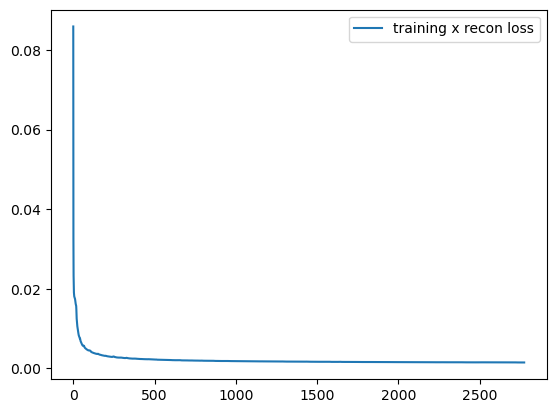

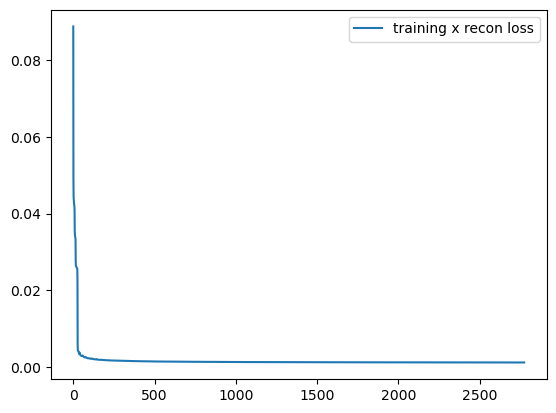

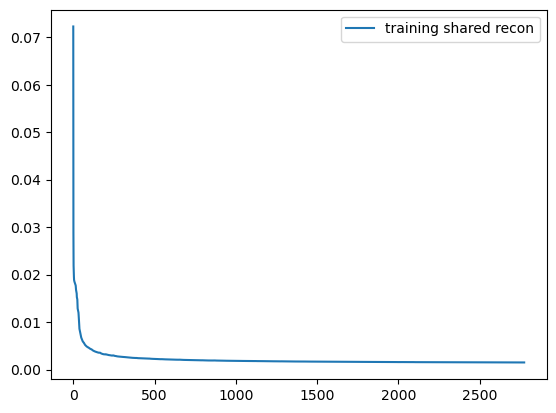

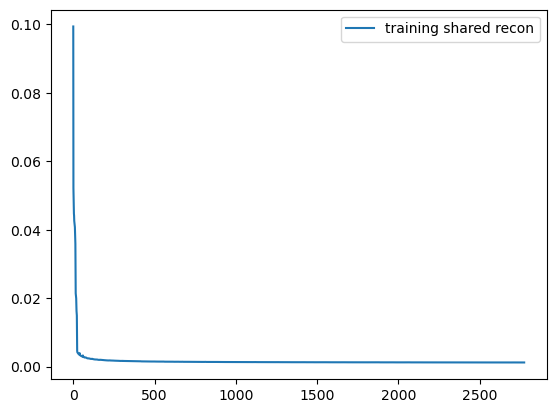

In [16]:
with open(os.path.join(modelsavepath_p_dna,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(stateDict_train_dna, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(modelsavepath_p_protein,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(stateDict_train_protein, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(modelsavepath_p_dna,'stateDictShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(stateDict_train_dnaShared, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(modelsavepath_p_protein,'stateDictShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(stateDict_train_proteinShared, output, pickle.HIGHEST_PROTOCOL)


with open(os.path.join(logsavepath_p_dna,'train_loss_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(train_loss, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath_p_dna,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(train_loss_x_dna, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath_p_dna,'train_loss_xShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(train_loss_xShared_dna, output, pickle.HIGHEST_PROTOCOL)


with open(os.path.join(logsavepath_p_protein,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(train_loss_x_protein, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath_p_protein,'train_loss_xShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(train_loss_xShared_protein, output, pickle.HIGHEST_PROTOCOL)

with open(os.path.join(logsavepath_p_dna,'train_lNorm_'+str(currLatentSize)), 'wb') as output:
    pickle.dump(train_lNorm, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath_p_dna,'train_lNormDNA_'+str(currLatentSize)), 'wb') as output:
    pickle.dump(train_lNorm_dna, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath_p_protein,'train_lNormProtein_'+str(currLatentSize)), 'wb') as output:
    pickle.dump(train_lNorm_protein, output, pickle.HIGHEST_PROTOCOL)


plt.plot(np.arange(epochs),train_loss_x_dna)
# plt.plot(np.arange(epochs),train_loss_kl_ep)
plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
plt.show()


plt.plot(np.arange(epochs),train_loss_x_protein)
# plt.plot(np.arange(epochs),train_loss_kl_ep)
plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_protein,'loss_seed3_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
plt.show()

plt.plot(np.arange(epochs),train_loss_xShared_dna)
# plt.plot(np.arange(epochs),train_loss_kl_ep)
plt.legend(['training shared recon','validation shared recon'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_xShared'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
plt.show()

plt.plot(np.arange(epochs),train_loss_xShared_protein)
# plt.plot(np.arange(epochs),train_loss_kl_ep)
plt.legend(['training shared recon','validation shared recon'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_protein,'loss_seed3_xShared'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
plt.show()

In [13]:
with torch.no_grad():
    i=0
    trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
    traintarget_protein=torch.tensor(imgsP_all[trainIdx_i]).cuda().float()
    trainIdx_i=torch.tensor(trainIdx_i)
    traintarget_dna=torch.tensor(imgsC_all[trainIdx_i]).cuda().float()
    trainInput_ID=plabels[trainIdx_i].cuda()
    trainInput_shared=latent_shared(trainIdx_i).cuda().float()
    trainInput_dna=latent_dna(trainIdx_i).cuda().float()
    trainInput_protein=latent_protein(trainIdx_i).cuda().float()
    #         print(trainInput.shape)


    recon_dna= modelcnn_dna(torch.cat((trainInput_shared,trainInput_dna),dim=1),pIDemb(trainInput_ID))
    reconShared_dna=modelcnn_dnaShared(trainInput_shared,pIDemb(trainInput_ID))
    recon_protein= modelcnn_protein(torch.cat((trainInput_shared,trainInput_protein),dim=1),pIDemb(trainInput_ID))
    reconShared_protein=modelcnn_pShared(trainInput_shared,pIDemb(trainInput_ID))

0


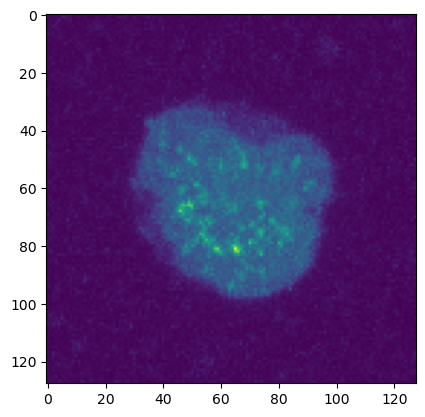

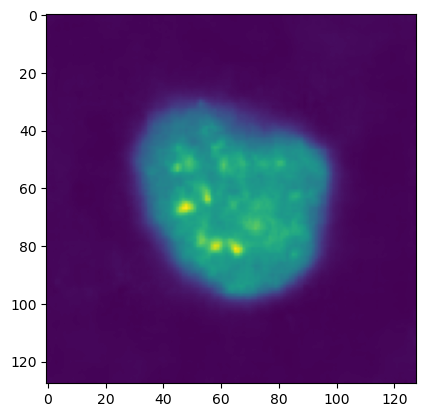

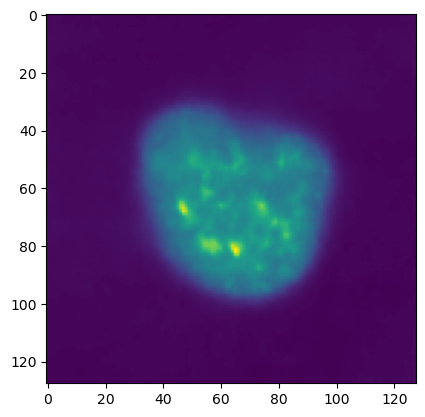

1


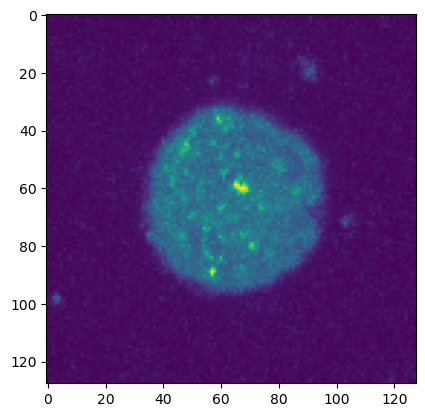

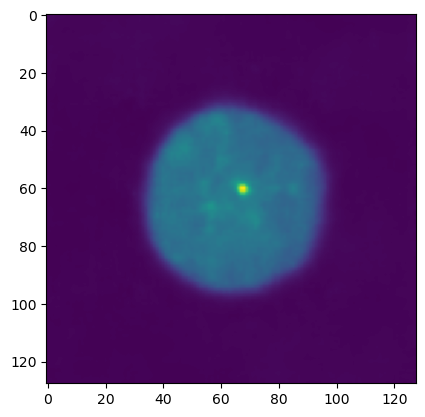

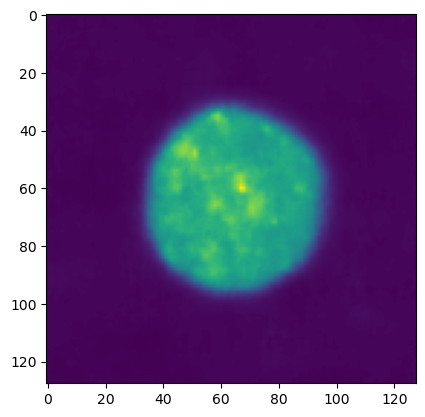

2


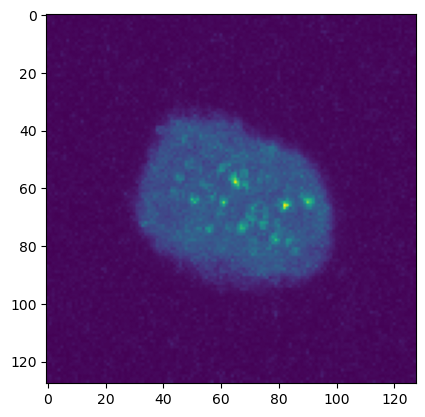

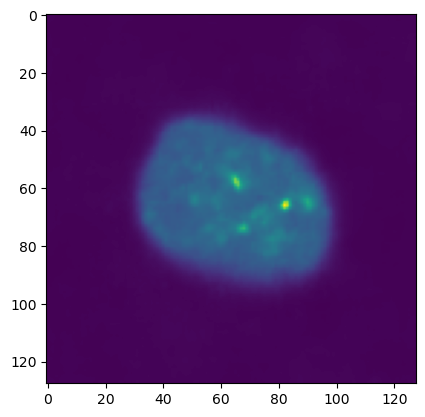

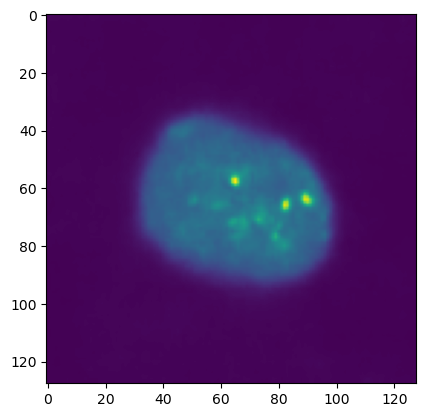

3


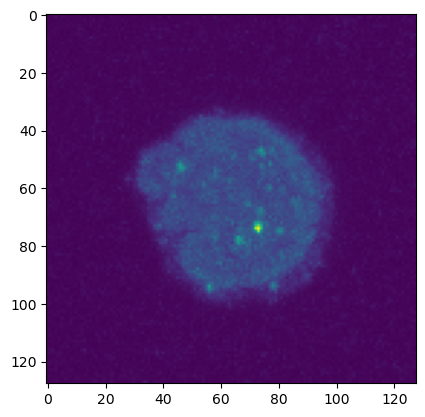

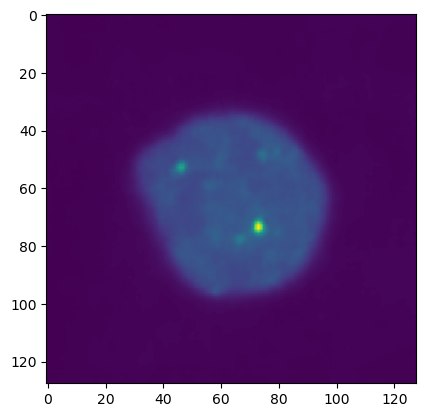

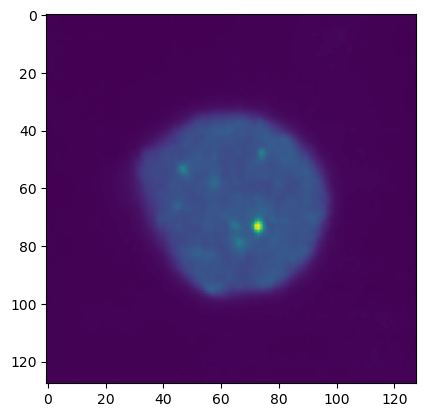

4


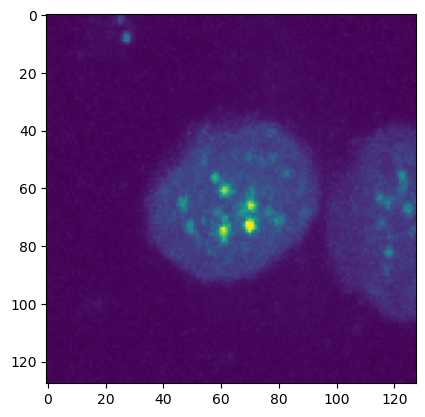

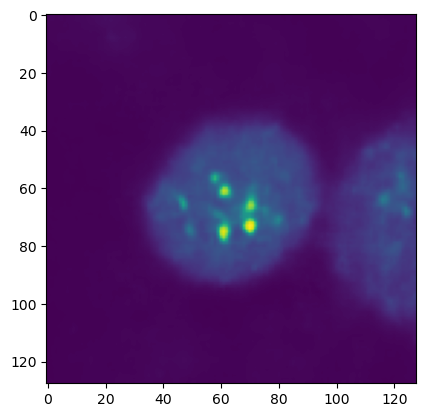

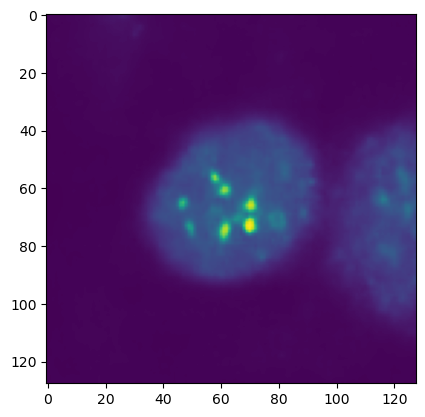

5


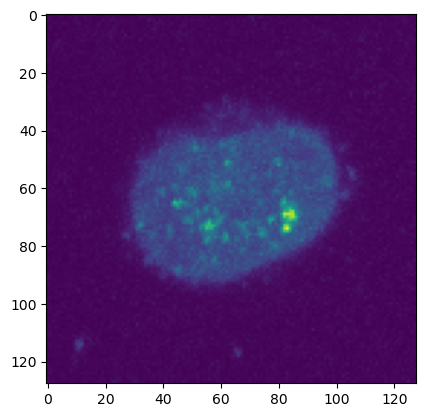

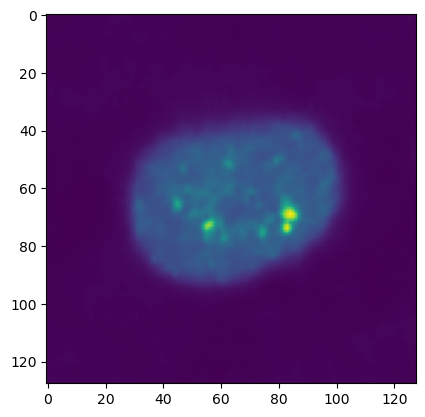

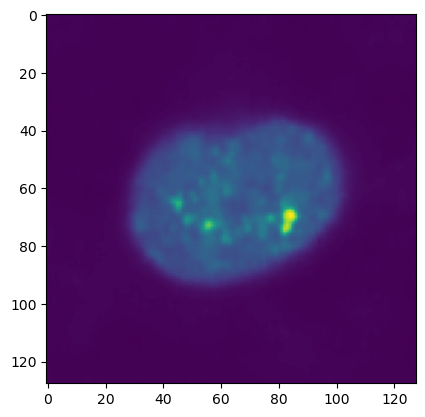

6


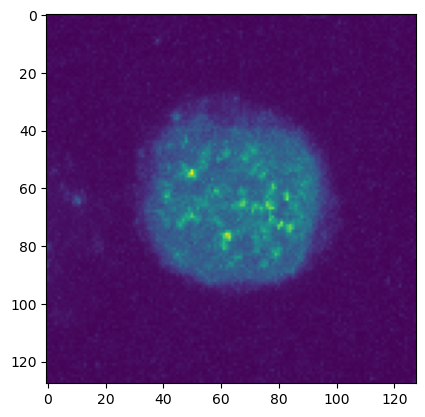

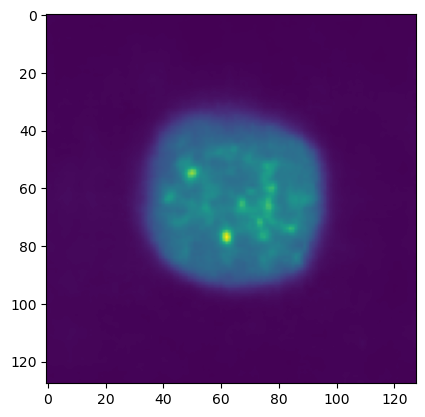

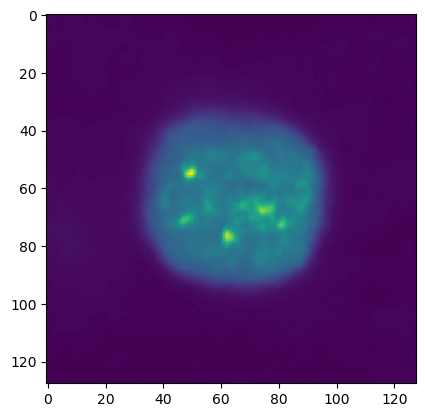

7


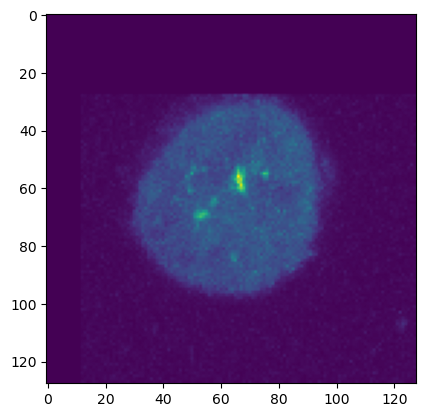

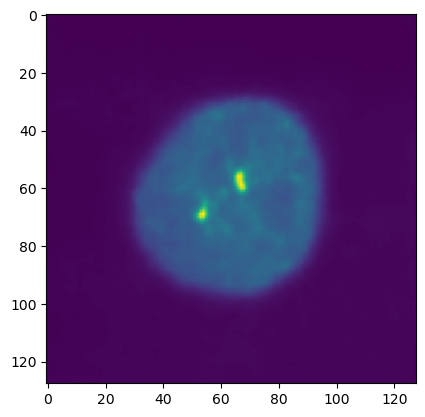

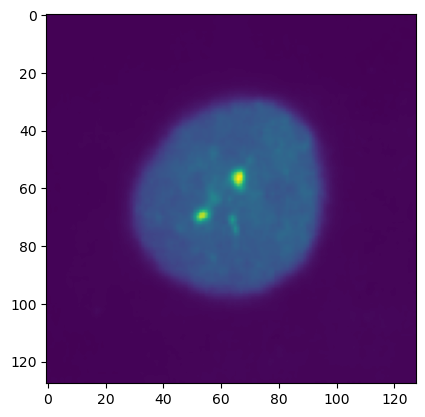

8


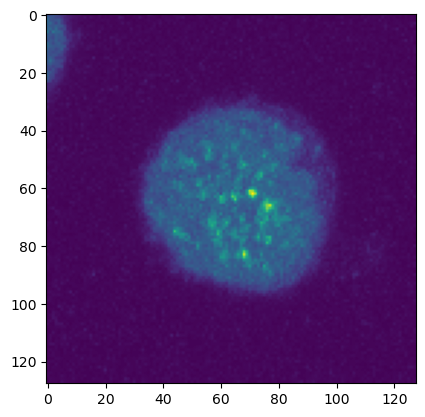

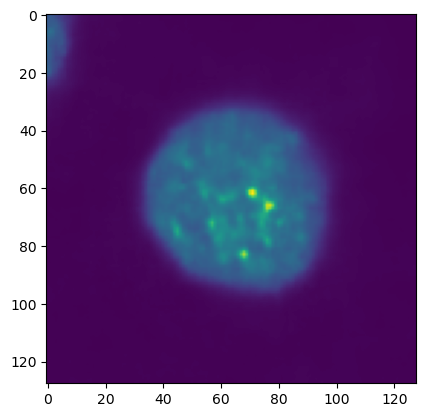

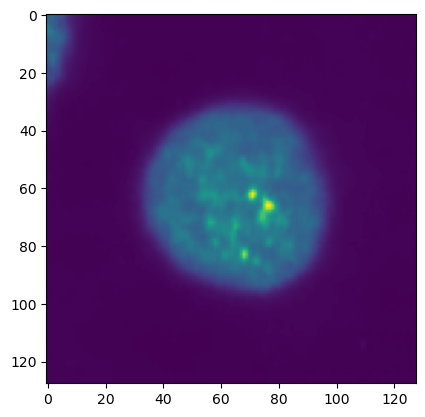

9


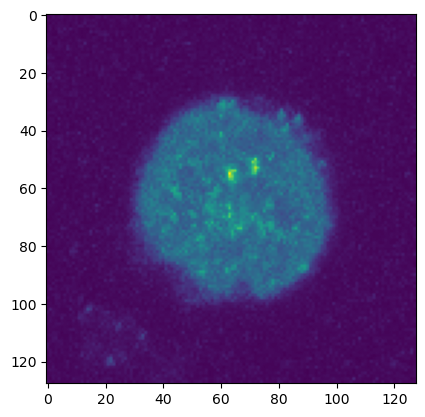

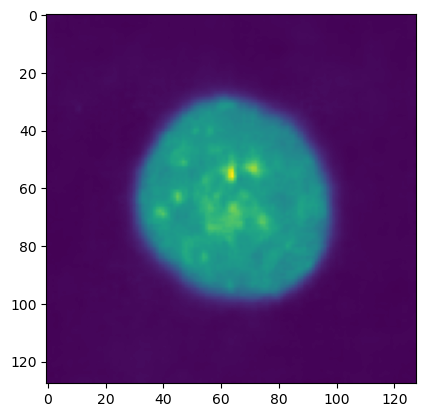

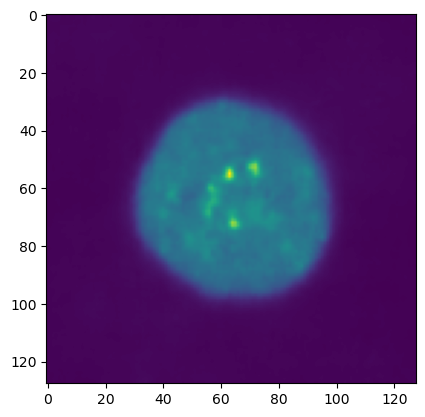

10


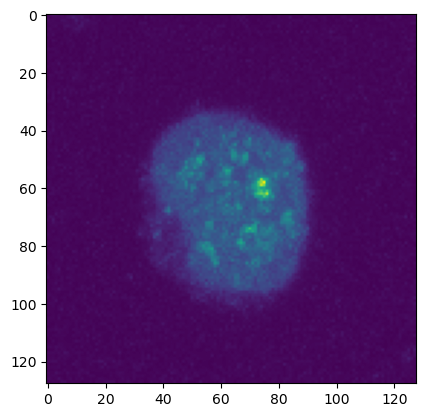

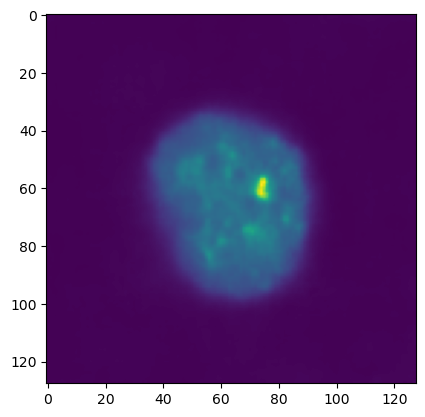

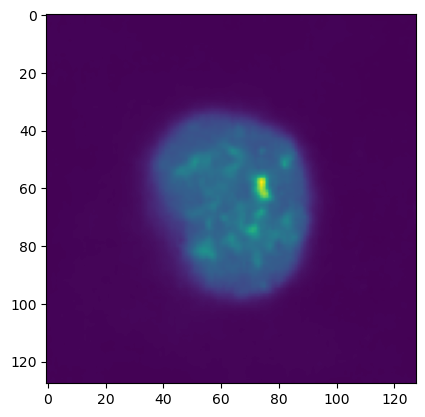

11


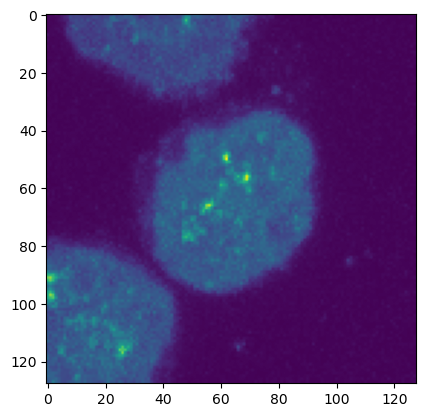

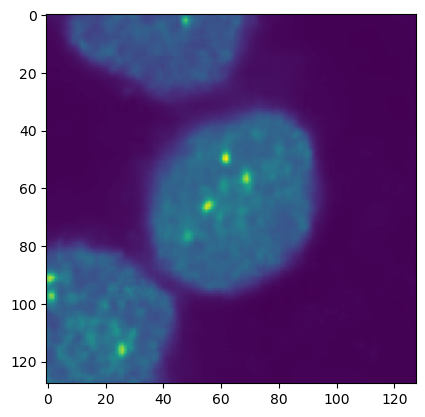

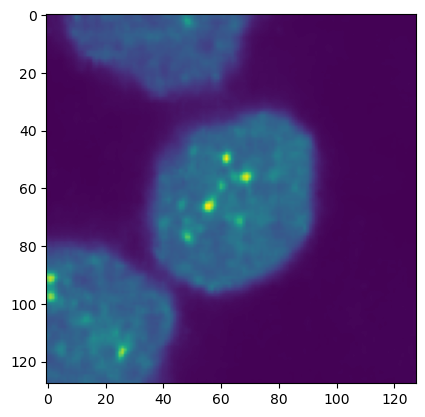

12


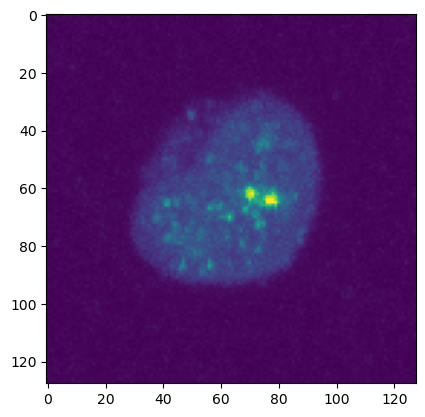

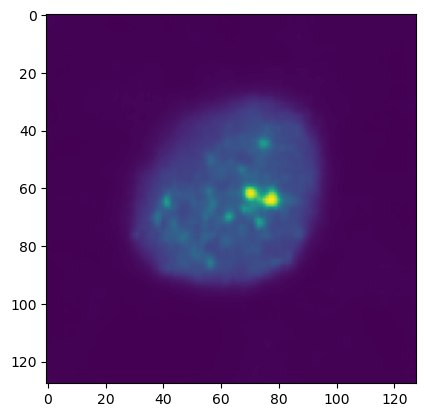

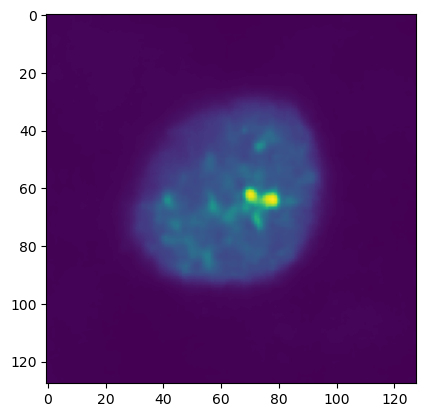

13


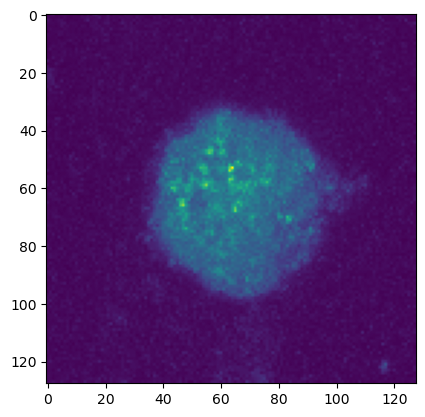

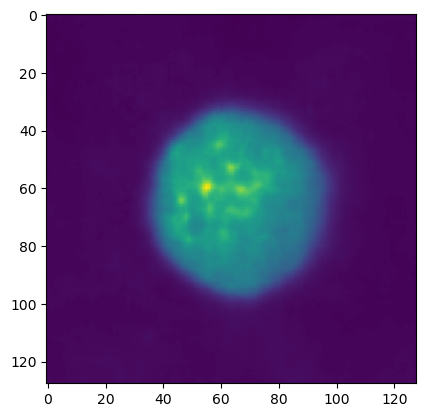

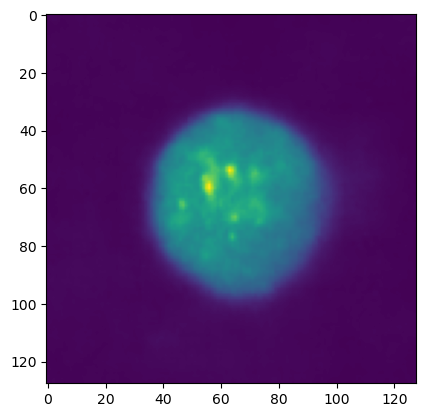

14


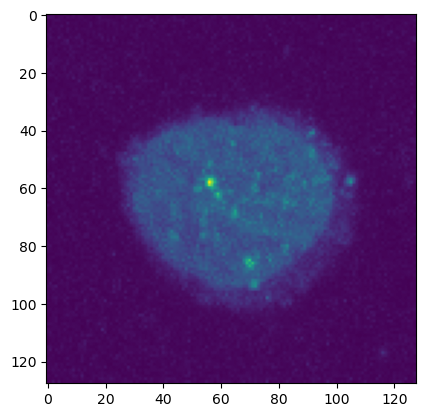

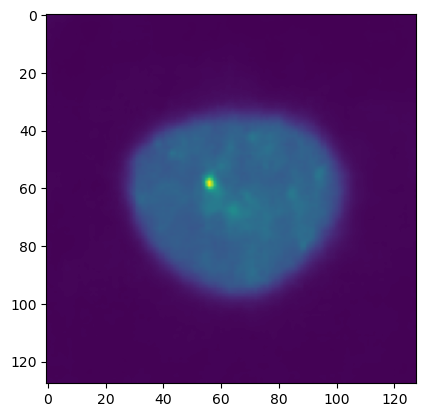

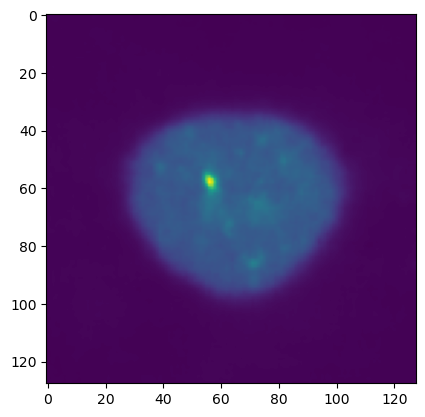

15


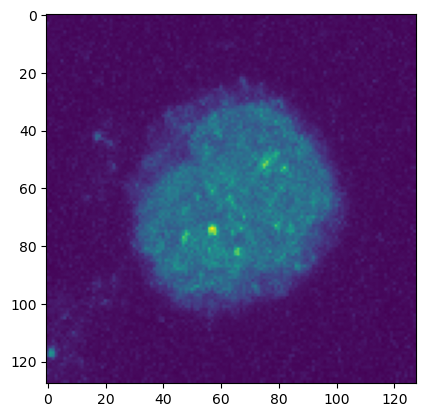

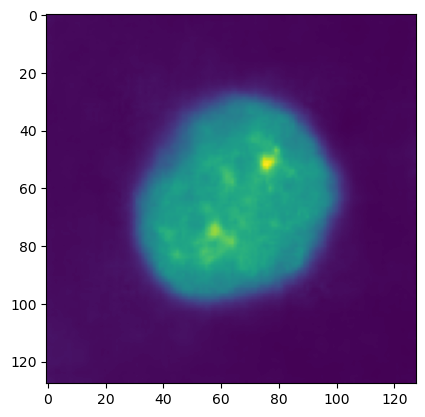

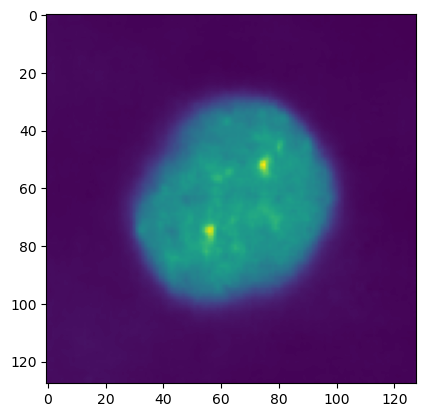

16


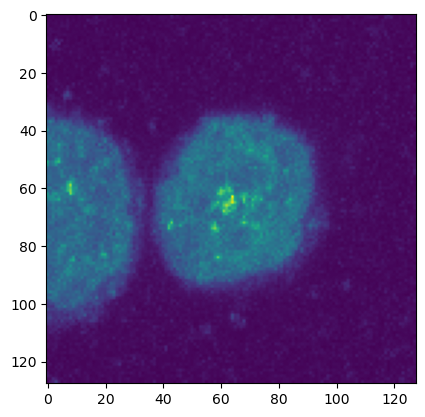

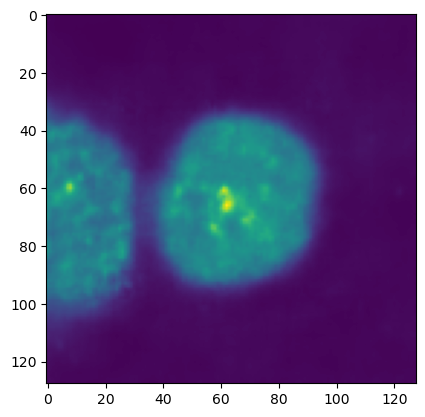

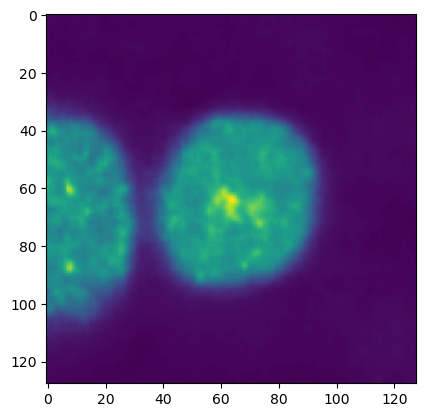

17


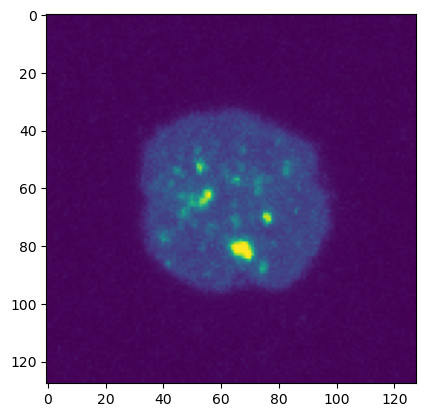

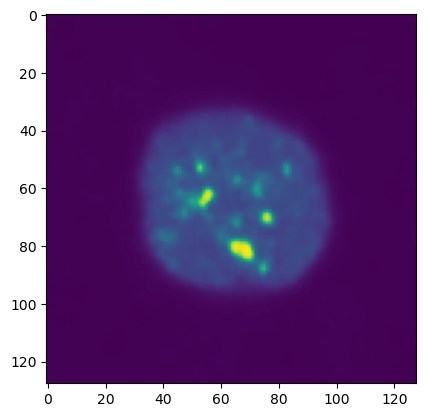

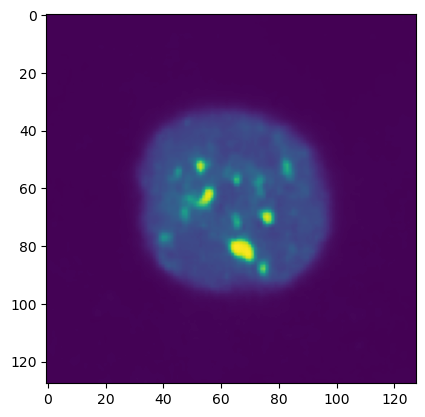

18


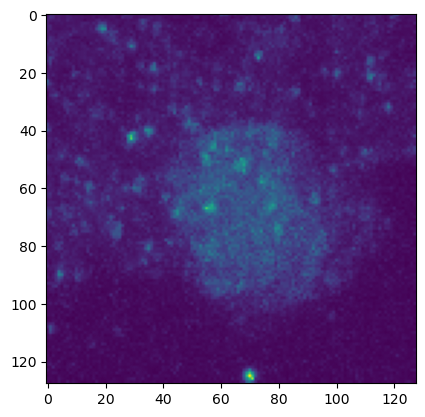

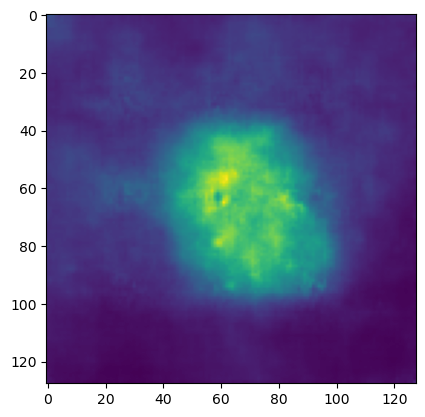

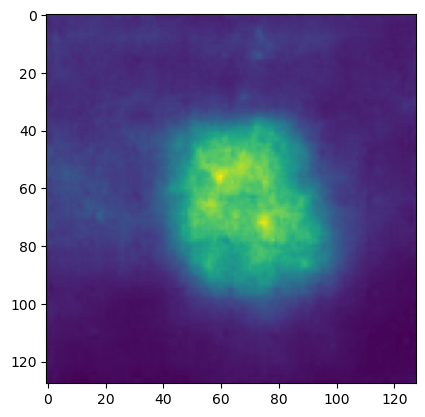

19


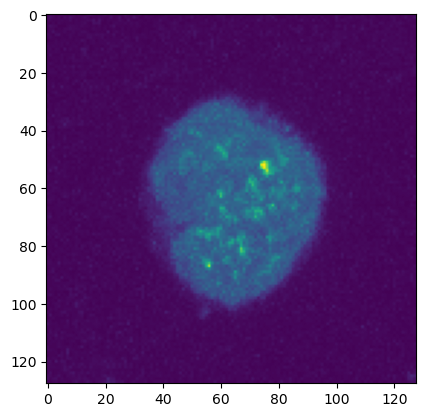

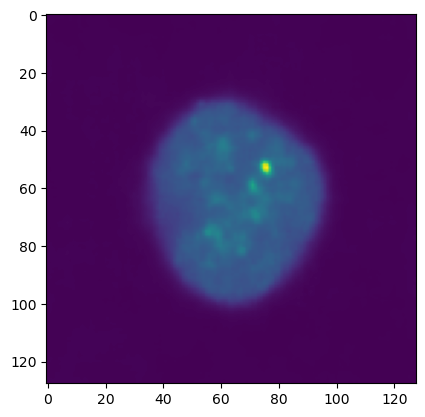

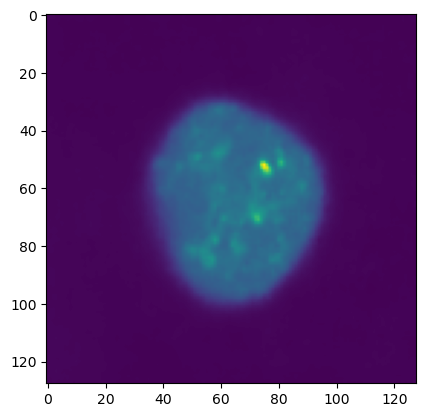

In [14]:
for i in range(20):
    print(i)
    plt.imshow(traintarget_protein[i][0].cpu().detach().numpy())
    plt.show()
    plt.imshow(reconShared_protein[i][0].cpu().detach().numpy())
    plt.show()
    plt.imshow(recon_protein[i][0].cpu().detach().numpy())
    plt.show()

0


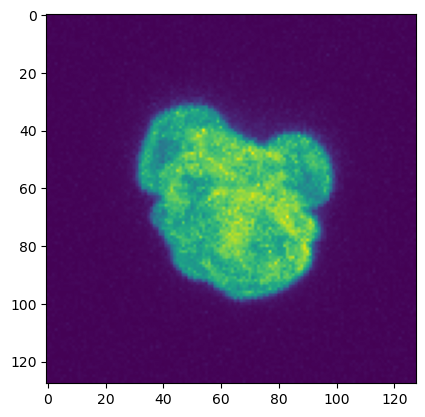

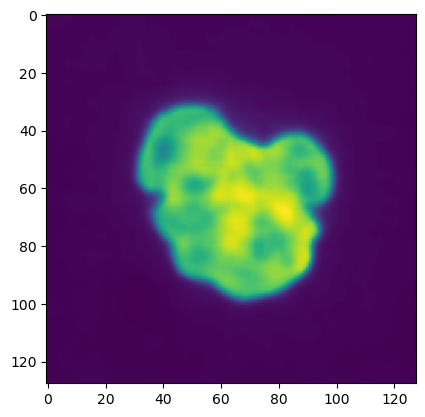

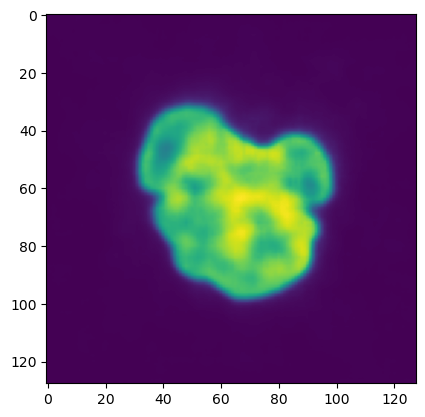

1


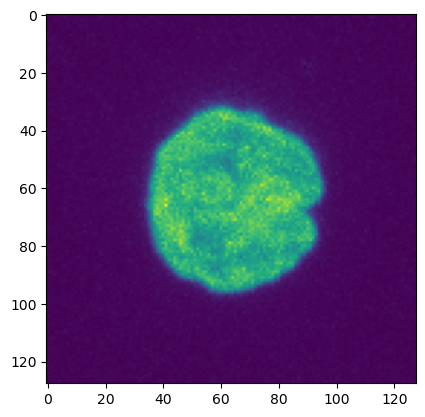

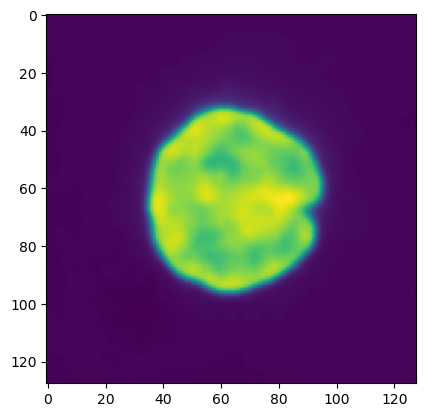

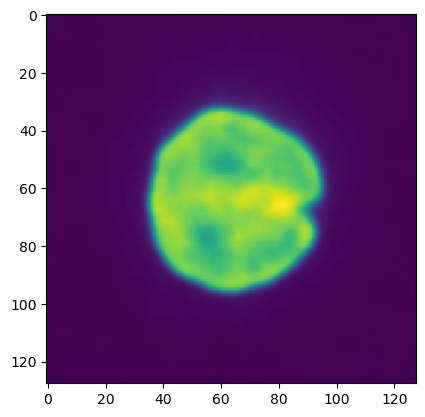

2


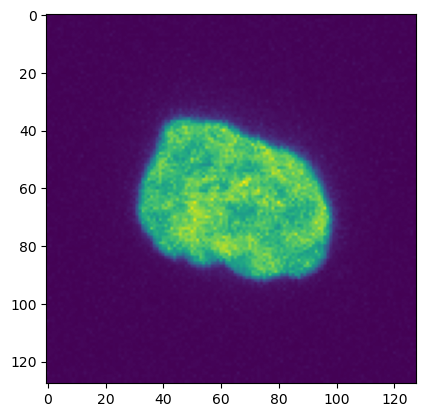

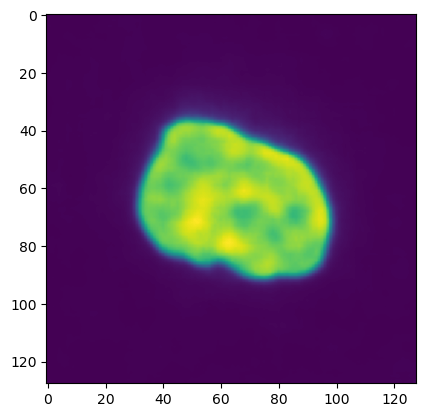

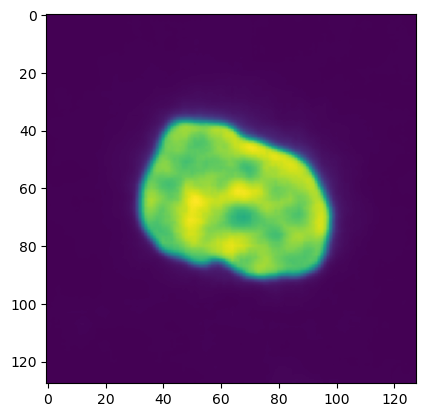

3


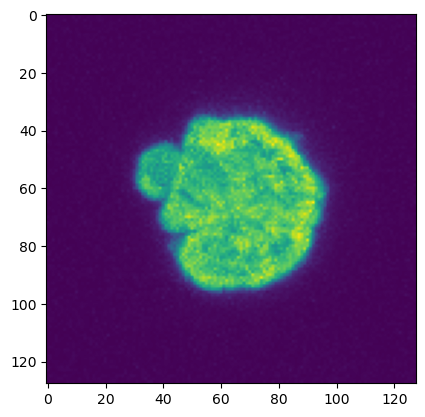

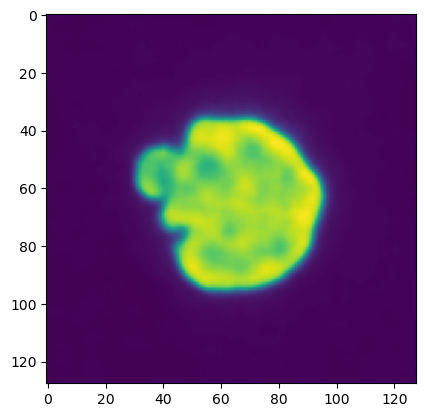

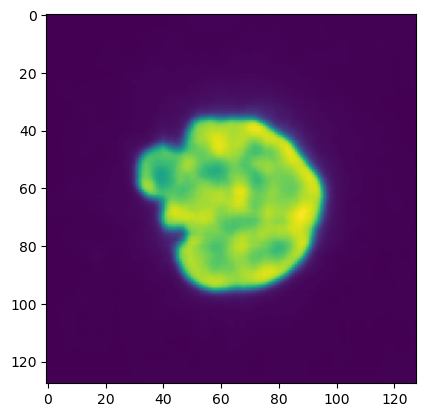

4


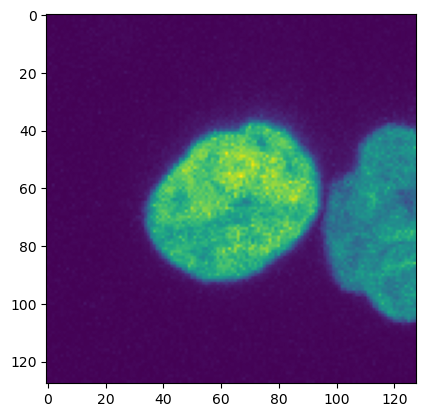

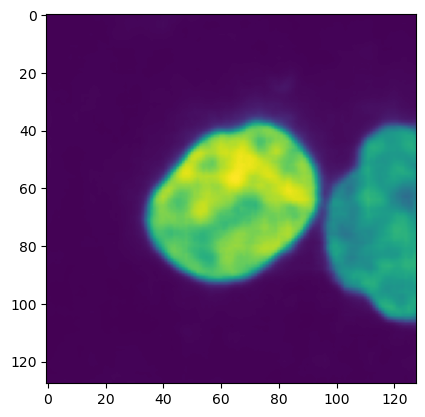

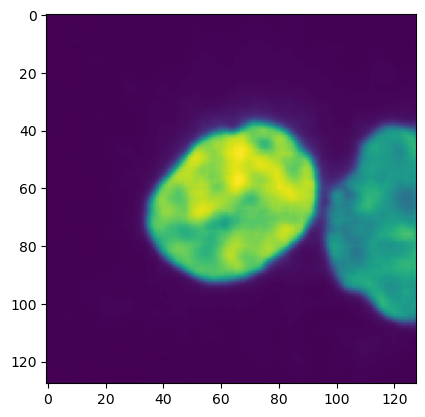

5


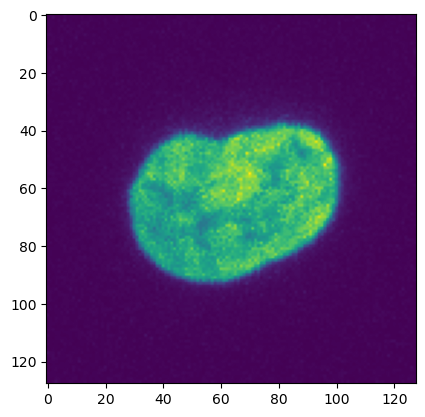

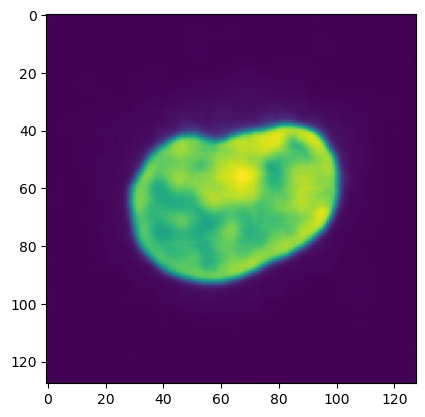

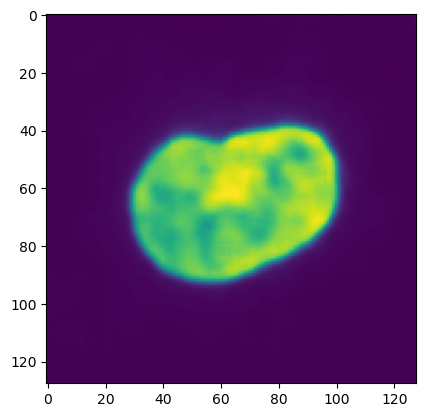

6


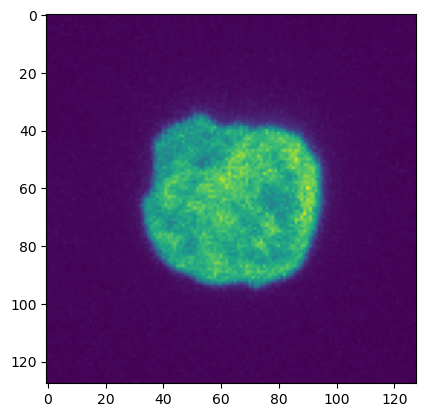

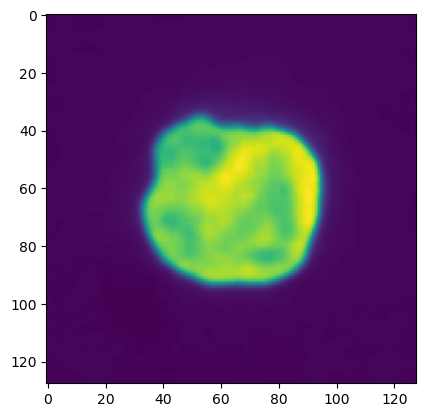

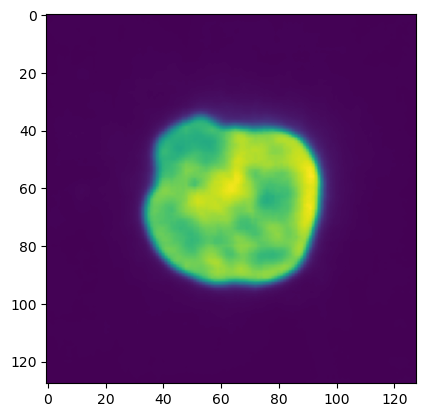

7


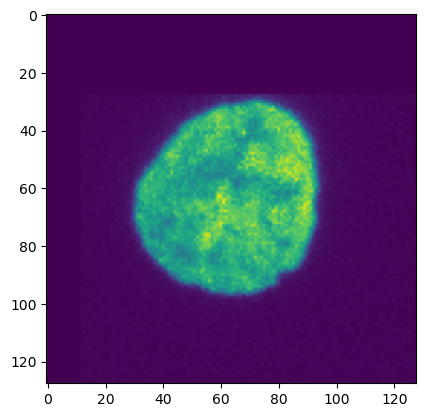

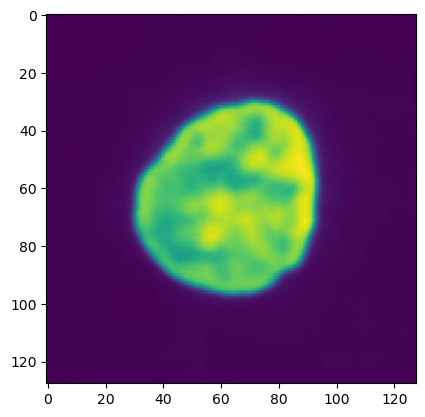

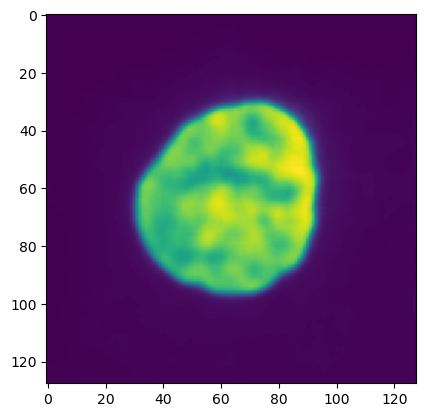

8


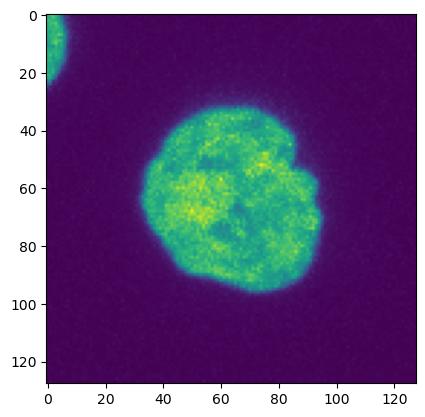

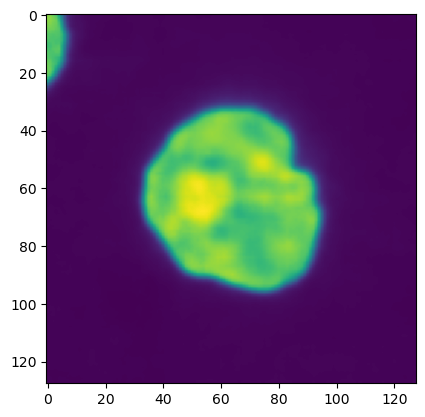

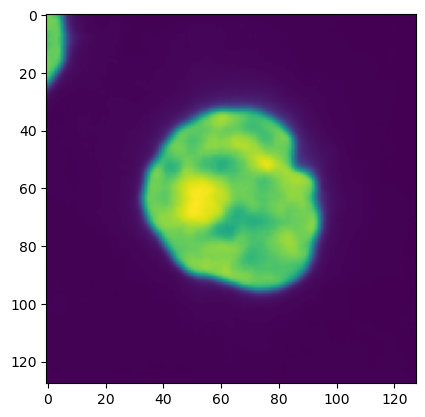

9


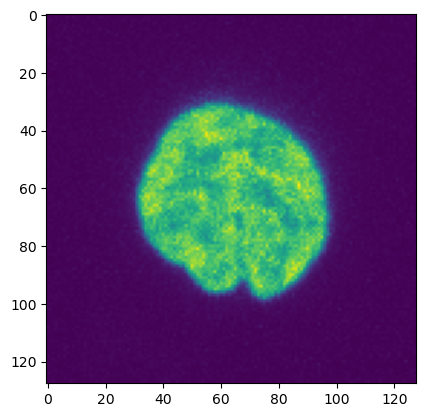

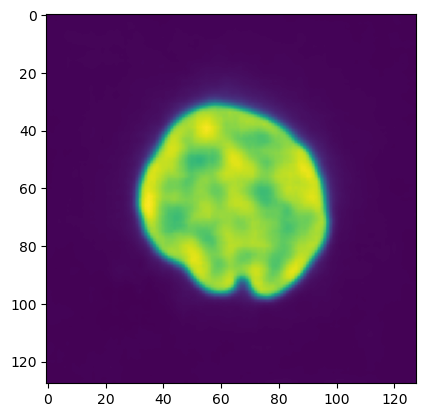

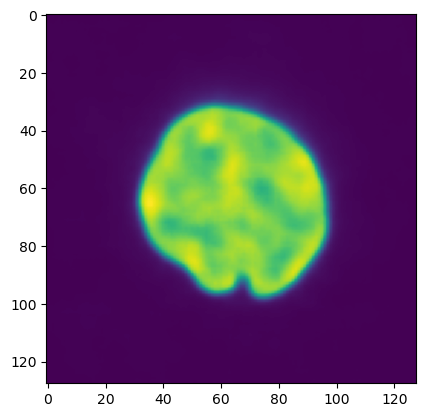

10


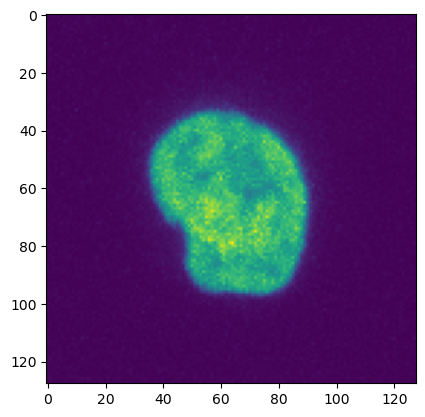

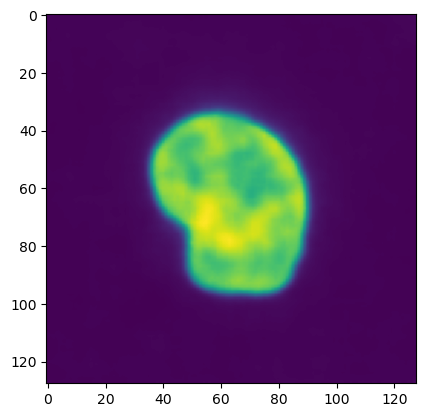

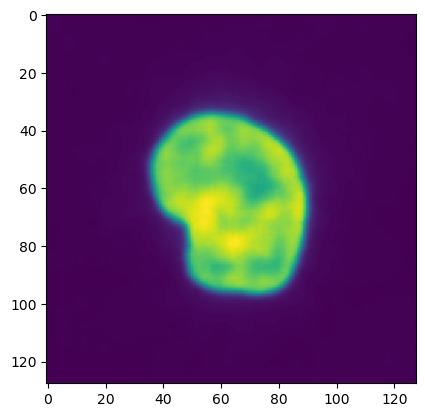

11


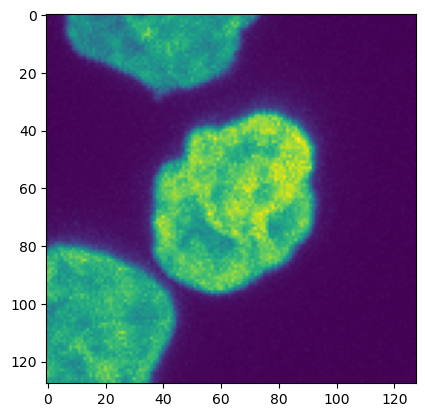

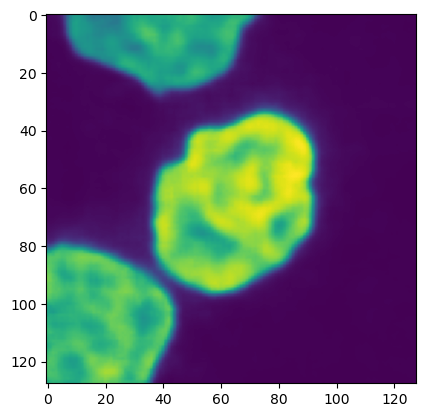

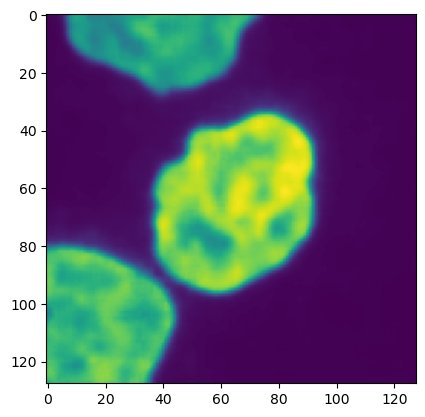

12


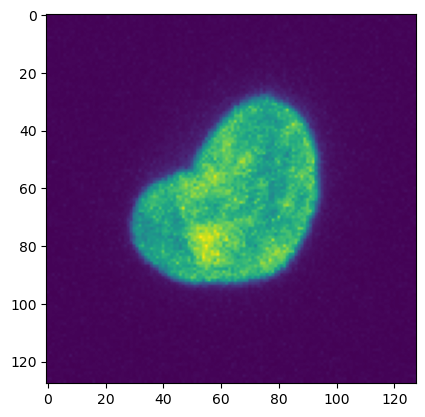

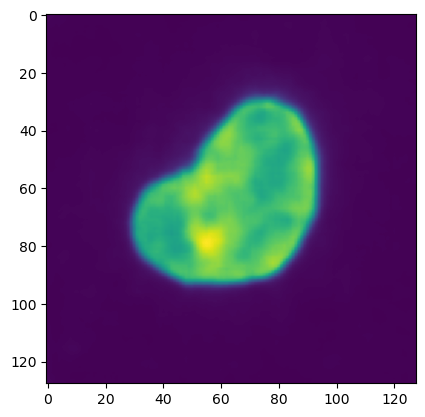

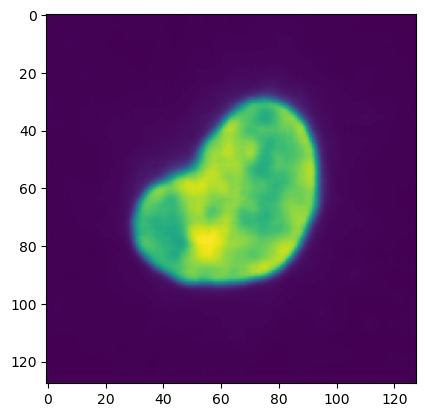

13


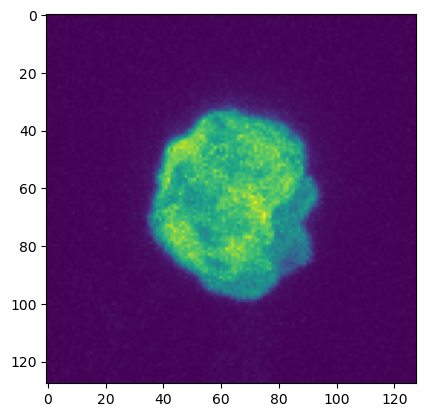

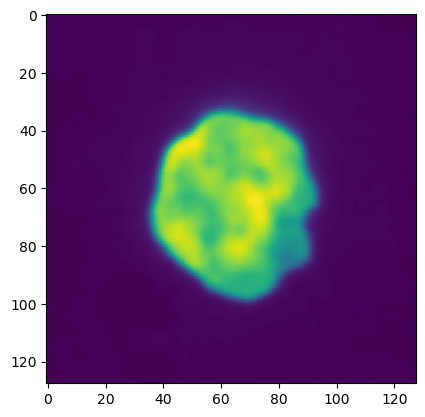

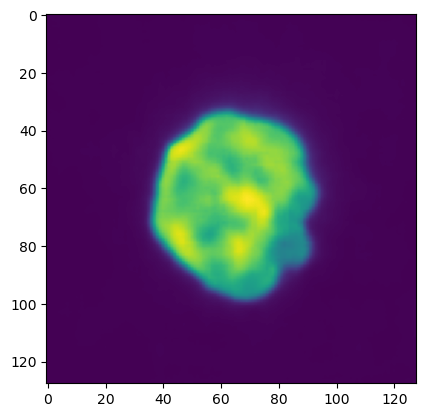

14


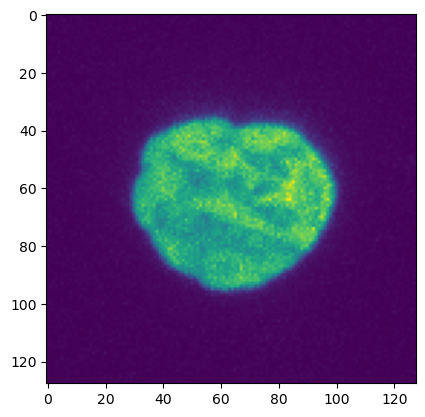

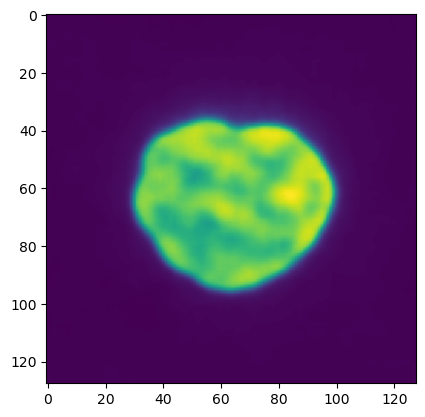

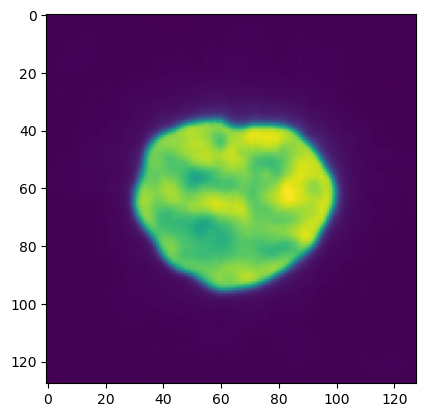

15


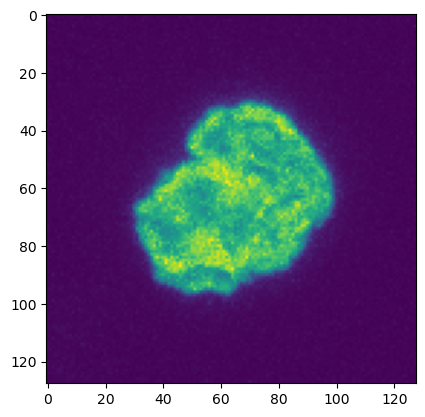

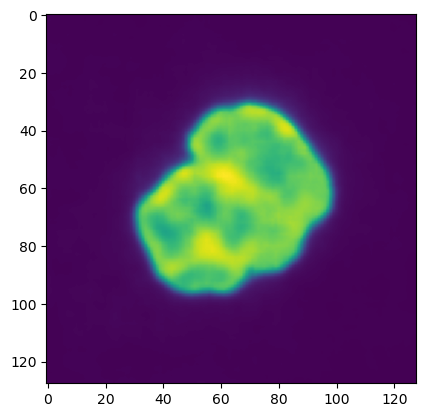

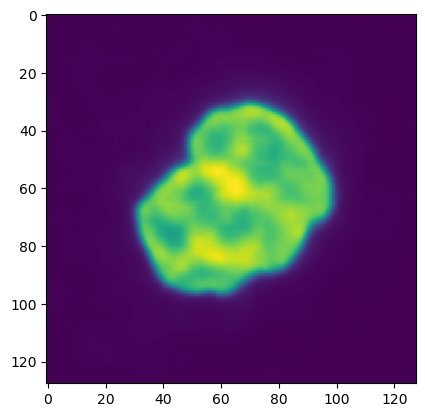

16


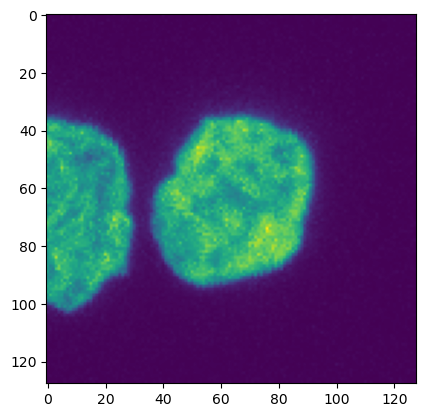

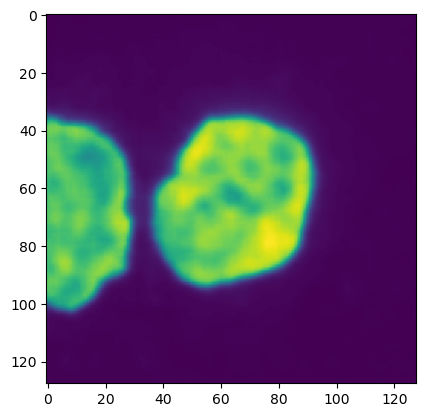

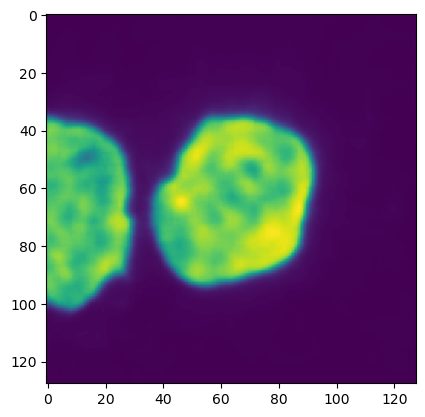

17


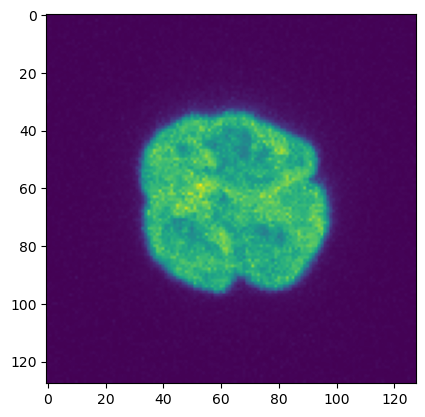

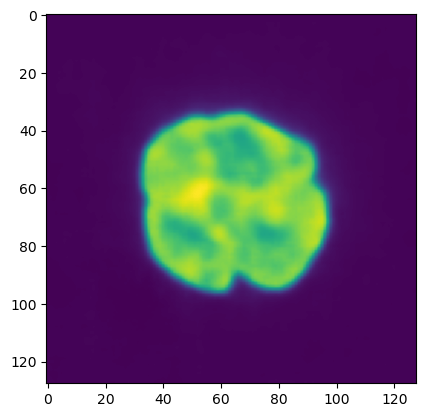

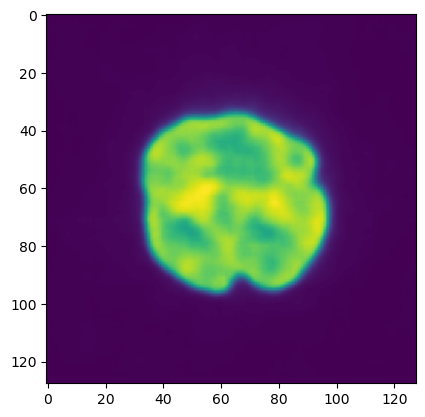

18


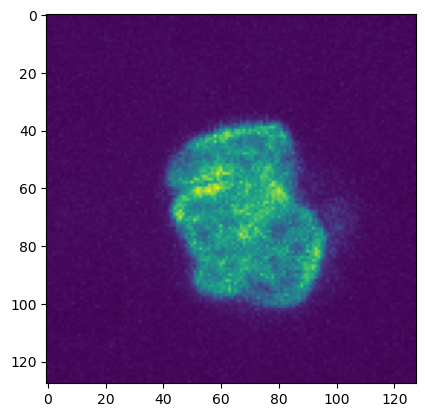

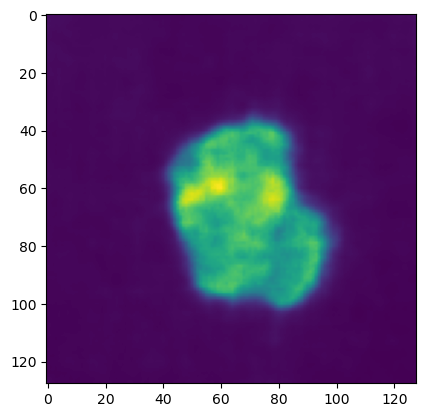

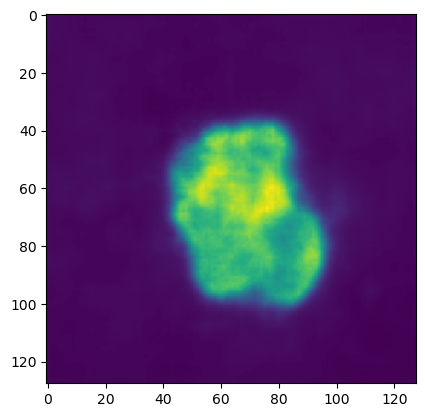

19


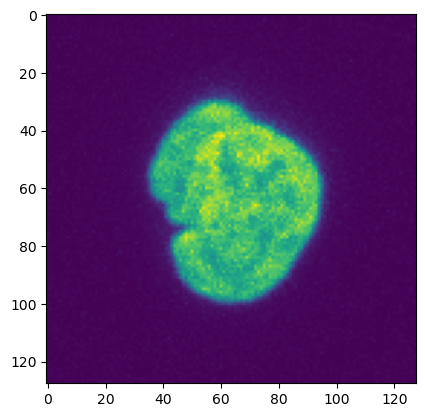

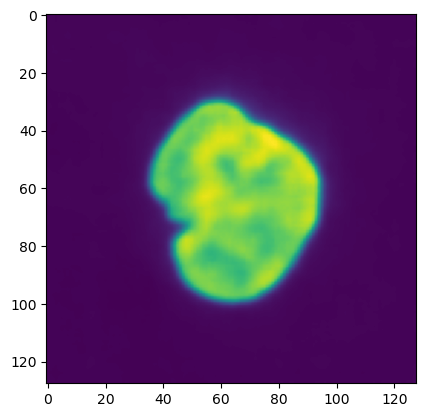

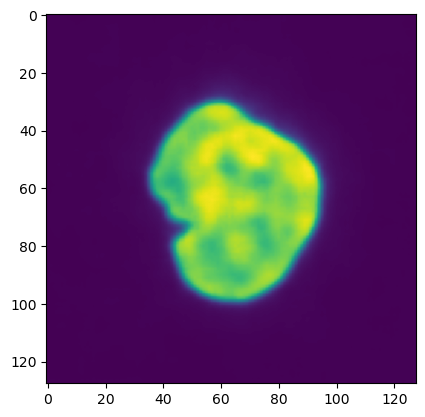

In [15]:
for i in range(20):
    print(i)
    plt.imshow(traintarget_dna[i][0].cpu().detach().numpy())
    plt.show()
    plt.imshow(reconShared_dna[i][0].cpu().detach().numpy())
    plt.show()
    plt.imshow(recon_dna[i][0].cpu().detach().numpy())
    plt.show()